# Modelisation de clustering

Ce notebook renferme les essais des différentes approches de modélisation pour segmenter nos données.

In [1]:
import time
import gc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import timedelta
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')
from sklearn.cluster import AgglomerativeClustering
from sklearn import cluster, preprocessing

## Méthodes du projet

In [2]:
# pour tracer les boxplot des différentes variables RFM en fonction du cluster
def display_box_plot_comparison(df_w_cluster, col_to_display):
    """ Affiche les boxplot par cluster de chaque variable """
    cluster_unique = sorted(df_w_cluster["cluster"].unique())
    X_quali = "cluster" # qualitative

    for col in col_to_display:
        Y_quanti = col # quantitative

        groupes = []
        for m in cluster_unique:
            groupes.append(df_w_cluster[df_w_cluster[X_quali]==m][Y_quanti])

        # Propriétés graphiques    
        medianprops = {'color':"black"}
        meanprops = {'marker':'o', 'markeredgecolor':'black',
                    'markerfacecolor':'firebrick'}
        plt.figure(figsize=(12,6))
        res = plt.boxplot(
            groupes, labels=cluster_unique, showfliers=False, medianprops=medianprops,
            vert=True, patch_artist=False, showmeans=True, meanprops=meanprops)
        plt.xlabel("Clusters")
        plt.ylabel("{} value".format(col))

        # pour tracer les lignes des limites pour discuter sur le graphique
        min_xlim, max_xlim = plt.xlim()
        boxes_lim = [item.get_ydata() for item in res['boxes']]
        for m in cluster_unique:
            temp_low = round(boxes_lim[m][1], 1)
            temp_up = round(boxes_lim[m][2], 1)
            plt.axhline(temp_low, color='k', linestyle='dashed', linewidth=1)
            plt.text(max_xlim*0.91, temp_low, '{}'.format(temp_low))
            plt.axhline(temp_up, color='k', linestyle='dashed', linewidth=1)
            plt.text(max_xlim*0.91, temp_up, '{}'.format(temp_up))

        plt.show()

In [3]:
import psutil, sys
def check_ressource_usage():
    """ Mesure l'utilisation de la RAM pour couper le process avant plantage """
    user = 'slerendu'
    # vals_cpu = np.mean([p.cpu_percent() for p in psutil.process_iter() if p.username() == user])
    vals_ram = sum([p.memory_percent() for p in psutil.process_iter() if p.username() == user])
    # print("CPU :", round(vals_cpu, 1), "%")
    if vals_ram > 50:
        print("RAM :", round(vals_ram, 1), "%")
    if vals_ram > 90:
        sys.exit()

In [4]:
def compute_dbscan(X_norm, ref_labels, epsilon_range=np.arange(0.1, 0.9, 0.10), min_sample_range=range(5, 25, 5), silent=True):
    """ Test du DBSCAN selon une gamme des 2 paramètres de base """
    start = time.time()
    result_dbscan = []
    nb_tot_combin = len(min_sample_range) * len(epsilon_range)
    nb_current_combi = 0
    for i in min_sample_range:
        for j in epsilon_range:
            nb_current_combi += 1
            dbscan = cluster.DBSCAN(eps=j,  min_samples=i)
            dbscan.fit(X_norm)
            check_ressource_usage()
            labels = dbscan.labels_
            n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
            n_noise_ = list(labels).count(-1)
            ari_dbscan = round(adjusted_rand_score(ref_labels, labels), 4)
            if not silent:
                print("-"*70)
                print("Epsilon :", round(j, 1), "- MinSample :", i)
                print("Clusters :", n_clusters_, "- Noise points :", n_noise_)
                print("ARI-Score :", ari_dbscan)
            perc_curr = (nb_current_combi/nb_tot_combin)*100
            perc_remain = ((nb_tot_combin - nb_current_combi)/nb_tot_combin)*100
            print("-"*int(perc_curr) + " "*int(perc_remain) + str(round(perc_curr, 1)) + "%")
            result_dbscan.append([round(j, 1), i, n_clusters_, n_noise_, ari_dbscan])
            del dbscan
            del ari_dbscan
            gc.collect()
    
    end = time.time()
    delta = round(end - start, 0)
    print("DBSCAN combinaisons parcourues en:", delta, "s, soit", round(delta/60, 0), "min, soit" , round(delta/3600, 0), "h.")
    return pd.DataFrame(result_dbscan, columns=['eps', 'minsample', 'cluster', 'noise', 'ari'])

In [5]:
from scipy.cluster.hierarchy import dendrogram
def plot_dendrogram(model, **kwargs):
    """ Affiche le Dendogramme du clustering hiérarchique """

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

In [6]:
def display_bilan_clusters_all(df, silent=False):
    """ Affiche le tableau comparatif des variables par cluster """
    agg = {}
    for col in df.columns:
        agg[col] = 'mean'
    agg['cluster'] = 'count'
    # on regroupe par customer_unique_id pour appliquer les aggrégations
    clustering_table = df.groupby(["cluster"]).agg(agg)
    # on renomme les colonnes pour l'étude des modèles
    clustering_table.rename(columns={'cluster': 'cluster_size'}, inplace=True)
    clustering_table["cluster_perc"] = round(clustering_table["cluster_size"] / len(df) * 100, 1)
    clustering_table.drop(-1, axis=0, inplace=True, errors='ignore') # pour supprimer la ligne de cluster de bruit du DBSCAN
    if not silent:
        display(clustering_table.head())
    return clustering_table

In [7]:
def compare_cluster_size(opt_k, X_n, df, col_to_study, lim_k=3):
    """
    A partir du nb de cluster optimal, on diminue le nb jusqu'à trouver l'optimal
    Affiche le comparatif des clusters
    """
    temp_k = opt_k
    print("Test du KMeans avec k =", temp_k)
    kmeans = cluster.KMeans(n_clusters=temp_k, random_state=42)
    kmeans.fit(X_n)
    # puis on récupère le libellé du cluster pour chaque client
    cluster_map = pd.DataFrame()
    cluster_map['customer_unique_id'] = df.index.values
    cluster_map['cluster'] = kmeans.labels_
    data_w_cluster = pd.merge(df[col_to_study], cluster_map, on="customer_unique_id", how="inner")
    data_w_cluster.set_index("customer_unique_id", inplace=True)
    res = display_bilan_clusters_all(data_w_cluster)
    
    if len(res.loc[res["cluster_perc"] < 5, :]) > 0 and temp_k > lim_k:
        data_w_cluster, kmeans = compare_cluster_size(temp_k-1, X_n, df, col_to_study, lim_k=lim_k)
    else:
        print("La valeur optimale de k est", temp_k)
    return data_w_cluster, kmeans

In [8]:
def custom_result_dbscan(df, X_norm, eps=0.2, min_samples=5):
    """ Clustering par DBSCAN avec affichage bilan du résultat """
    # on relance le DBSCAN avec le nb de cluster optimal
    dbscan = cluster.DBSCAN(eps=eps, min_samples=min_samples)
    dbscan.fit(X_norm)
    # puis on récupère le libellé du cluster pour chaque client
    cluster_map_db = pd.DataFrame()
    cluster_map_db['customer_unique_id'] = data.index.values
    
    labels = dbscan.labels_
    cluster_map_db['cluster'] = labels
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise_ = list(labels).count(-1)
    print("Nombre de clusters :", n_clusters_)
    print("Nombre de points dans le bruit :", n_noise_, "soit", round(n_noise_/len(data)*100, 2), "%")
    # on incorpore cette données au dataframe global
    data_w_cluster_db = pd.merge(df, cluster_map_db, on="customer_unique_id", how="inner")
    data_w_cluster_db.set_index("customer_unique_id", inplace=True)
    
    return data_w_cluster_db

In [9]:
def test_scenario(df, col_to_study, ca_global_ref, display_boxplot=False, lim_k=3):
    """ Test du scénario de migration de population d'un cluster à l'autre """
    X = df[col_to_study].values
    scaler = preprocessing.RobustScaler()
    X_norm = scaler.fit_transform(X)
    
    optimal_k = define_cluster_numbers(X_norm)
    data_w_cluster, kmeans = compare_cluster_size(optimal_k, X_norm, df, col_to_study, lim_k=lim_k)
    res = display_bilan_clusters_all(data_w_cluster, silent=True)
    if display_boxplot:
        display_box_plot_comparison(data_w_cluster, col_to_study)
    
    # on tri le résultat par valeur de monetary pour avoir le dernier en valeurs plus importante
    res = res.sort_values(by="rfm_monetary").reset_index(drop=True)
    # on récupère les index de cluster par type
    idx_list = {}
    for index, value in enumerate(res.index[:-1]):
        idx_list[index] = value
        # idx_clust_little = res.index[0]
        # idx_clust_medium = res.index[1]
    
    data_scenario = data_w_cluster.copy()

    # modification de 20% des acheteurs moins actifs
    for key, value in idx_list.items():
        change = data_scenario.loc[data_w_cluster["cluster"] == value, :].sample(frac = 0.2, random_state=42).index
        data_scenario.loc[change,'rfm_monetary'] = res.iloc[-1].rfm_monetary
    
    # calcul du nouveau CA global
    ca_global_ref_scenario = data_scenario["rfm_monetary"].sum()
    print("Configuration avec les variables :", ', '.join(col_to_study))
    print("Le CA global pour cette configuration est de",
          f'{round(ca_global_ref_scenario, 2):,}'.replace(',', ' '),
          "€, soit une augmentation de",
          f'{round(ca_global_ref_scenario-ca_global_ref, 2):,}'.replace(',', ' '),
          "€, càd", round((ca_global_ref_scenario-ca_global_ref)/ca_global_ref*100, 1), "%")
    return kmeans

### YellowBrick

In [10]:
from yellowbrick.cluster import KElbowVisualizer
def define_cluster_numbers(X_norm, metric='distortion', nb_clusters=(2, 11)):
    """ Définie le nombre de cluster optimal pour l'algo KMeans """
    start = time.time()
    
    clust = cluster.KMeans(random_state=42)
    visualizer = KElbowVisualizer(clust, metric=metric, k=nb_clusters)
    visualizer.fit(X_norm)
    visualizer.poof()
    
    end = time.time()
    delta = round(end - start, 0)
    print("Clusters définis en:", delta, "s, soit", round(delta/60, 0), "min, soit" , round(delta/3600, 0), "h.")
    print("D'après cette analyse, le nombre de cluster optimal est de", visualizer.elbow_value_)
    return visualizer.elbow_value_

In [11]:
from yellowbrick.cluster import SilhouetteVisualizer
def display_silhouette_clusters(X_norm, nb_clusters=[]):
    """ Affiche le diagramme de silhouette piur l'algo du KMeans """
    start = time.time()
    if len(nb_clusters) == 0:
        print("La liste de nombre de clusters n'est pas renseignée.")
    else:
        for n_cluster in nb_clusters:
            print("Visualisation avec", n_cluster, "clusters en cours...")
            kmeans = cluster.KMeans(n_clusters=n_cluster, random_state=42)
            visualizer = SilhouetteVisualizer(kmeans)
            visualizer.fit(X_norm)
            visualizer.poof()
    
            end = time.time()
            delta = round(end - start, 0)
            start = time.time()
            print("Visualisation de Silhouette sur", n_cluster, " clusters fait en :", delta, "s, soit", round(delta/60, 0), "min, soit" , round(delta/3600, 0), "h.")    

## Chargement des données

On commence par charger le dataset d'étude préparé dans le notebook d'analyse exploratoire.

In [12]:
data = pd.read_csv("model_dataset.csv", encoding='utf-8', sep='\t', index_col=0)

In [13]:
data.shape

(94721, 7)

In [14]:
data.head()

,rfm_recency,rfm_frequency,rfm_monetary,panier_moyen,avance_sur_livraison_moyen,review_score_mean,fiche_score
customer_unique_id,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,116,1,25.5420,25.5420,4.132905,5.0,0.774648
0000b849f77a49e4a4ce2b2a4ca5be3f,119,1,4.8942,4.8942,4.248125,4.0,0.718310
0000f46a3911fa3c0805444483337064,542,1,15.5196,15.5196,1.389734,3.0,0.619718
0000f6ccb0745a6a4b88665a16c9f078,326,1,7.8516,7.8516,11.108970,4.0,0.535211
0004aac84e0df4da2b147fca70cf8255,293,1,35.4402,35.4402,7.035463,5.0,0.746479


Il est important de se poser la question sur la pertinence des données. Si on veut des données conséquentes, il faudrait une période de 1 an durant laquelle il y a un maximum de données. On peut le voir sur la période entre 09/2017 jusqu'à 08/2018.  
Cependant, le graphique précédent nous montre surtout le début de l'entreprise qui a été fondée en février 2015. Il y a donc 2 approches possibles : 
 - toutes les données : pour nous montrer l'évolution des clients et des performances
 - la dernière année pertinente : pour étudier la performance de l'entreprise à un instant donné

# Clustering

In [15]:
col_to_study = ["rfm_recency", "rfm_frequency", "rfm_monetary"]#, "panier_moyen", "avance_sur_livraison_moyen", "review_score_mean", "fiche_score"]

In [16]:
# on prépare les données en les normalisant
X = data[col_to_study].values
scaler = preprocessing.RobustScaler()
X_norm = scaler.fit_transform(X)

## KMeans

### Recherche du nombre de clusters optimal

A l'aide du KMeans, on évalue le nombre de cluster optimal.

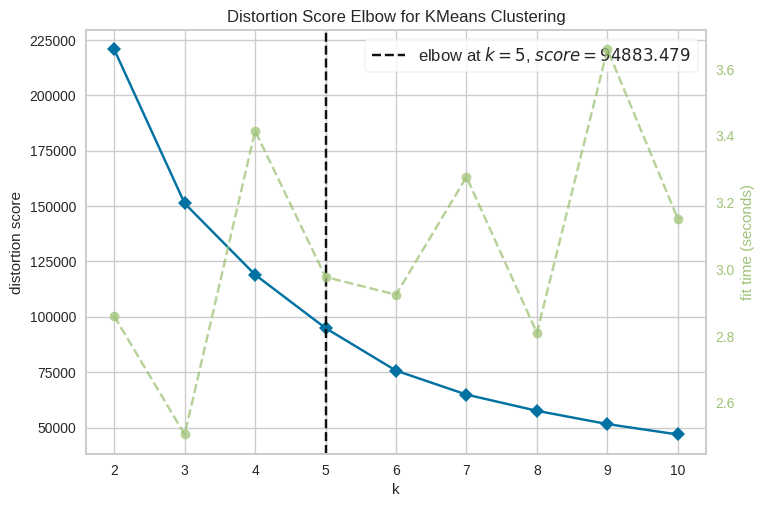

Clusters définis en: 28.0 s, soit 0.0 min, soit 0.0 h.
D'après cette analyse, le nombre de cluster optimal est de 5


In [17]:
optimal_k = define_cluster_numbers(X_norm)

Et on visualise le diagramme de silouhettes.

Visualisation avec 5 clusters en cours...


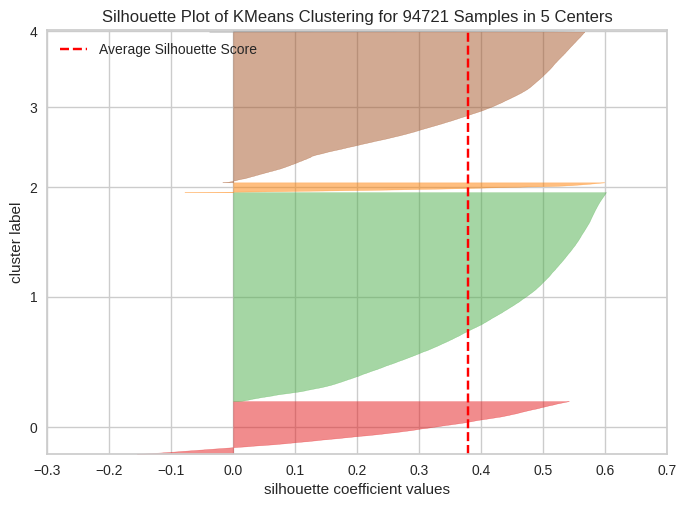

Visualisation de Silhouette sur 5  clusters fait en : 215.0 s, soit 4.0 min, soit 0.0 h.


In [18]:
display_silhouette_clusters(X_norm, nb_clusters=[optimal_k])

In [19]:
sns.reset_orig()

### Etude des clusters

In [20]:
# data_w_cluster, kmeans = compare_cluster_size(5, X_norm, data, col_to_study)
data_w_cluster, kmeans = compare_cluster_size(optimal_k, X_norm, data, col_to_study)

Test du KMeans avec k = 5


,rfm_recency,rfm_frequency,rfm_monetary,cluster_size,cluster_perc
cluster,,,,,
0,240.953486,1.297704,71.420069,11760,12.4
1,134.036746,1.034565,19.117948,46753,49.4
2,244.242134,1.448700,190.657949,2193,2.3
3,396.068949,1.036670,18.720127,33706,35.6
4,237.514563,1.556634,480.205515,309,0.3


Test du KMeans avec k = 4


,rfm_recency,rfm_frequency,rfm_monetary,cluster_size,cluster_perc
cluster,,,,,
0,243.405093,1.030960,18.125369,77908,82.2
1,236.979943,1.538682,462.722761,349,0.4
2,245.302679,1.435426,179.572764,2501,2.6
3,243.481773,1.273580,65.063774,13963,14.7


Test du KMeans avec k = 3


,rfm_recency,rfm_frequency,rfm_monetary,cluster_size,cluster_perc
cluster,,,,,
0,243.472334,1.045629,20.607670,84726,89.4
1,248.060280,1.501615,334.148481,929,1.0
2,242.693911,1.350430,96.488975,9066,9.6


La valeur optimale de k est 3


En partant du k optimal théorique de 5, on peut voir qu'il y a un cluster représentant moins de 1% des données. En passant à une valeur de k plus petite, nous arrivons progressivement à des clusters plus conséquents d'un point de vue métier. Dans notre cas, nous utiliserons une répartition en 3 clusters.

Un cluster est certes peu représenté, mais il dénombre les clients ayant dépensé le plus (> 300 €) et étant plus fidèles (1.5 fois). Nous allons donc concerver cette configuration pour le KMeans.  
Regardons la représentation des ces répartitions avec des boxplots.

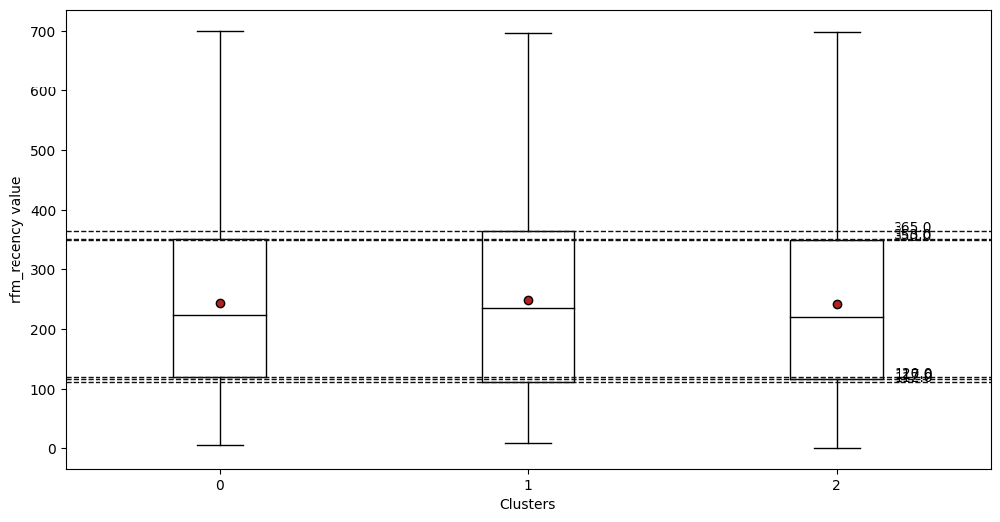

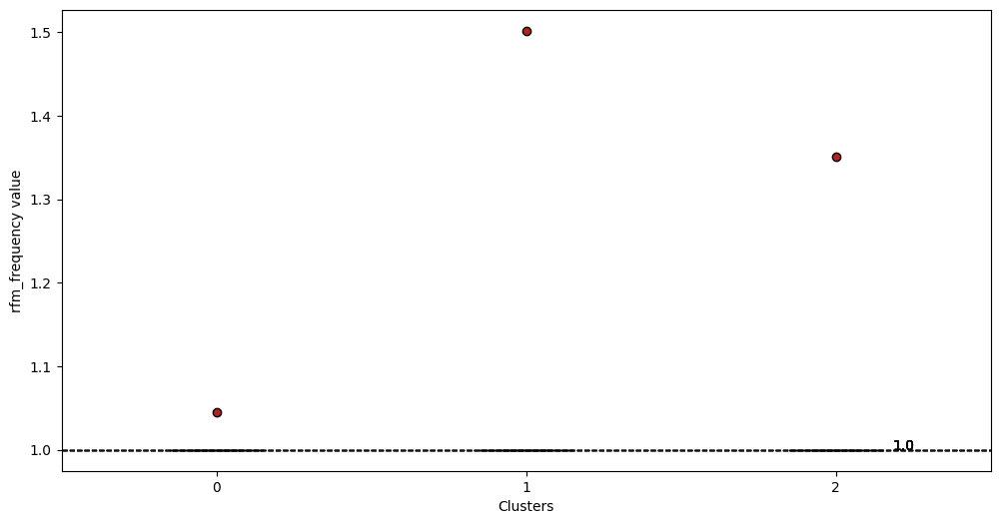

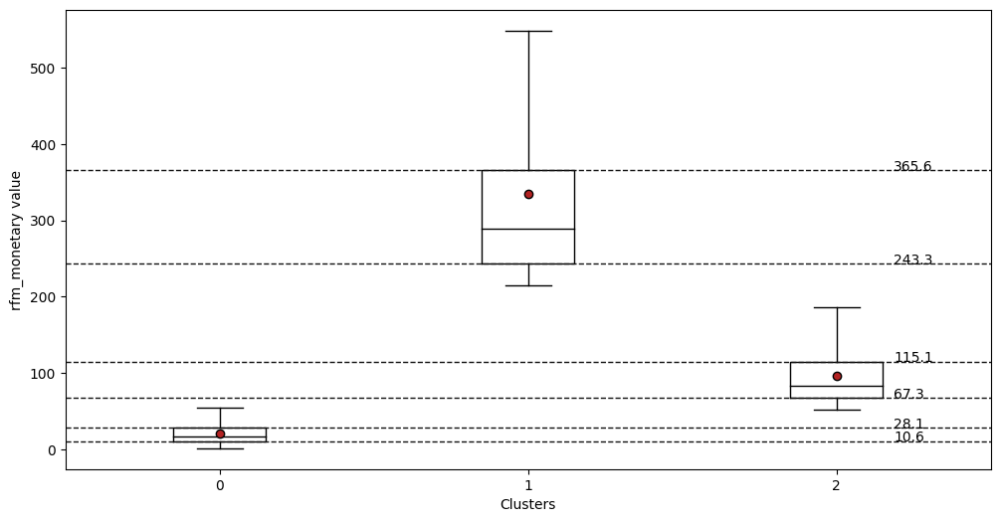

In [21]:
display_box_plot_comparison(data_w_cluster, col_to_study)

On observe bien les 3 groupes : 
 - bons acheteurs (entre 240 et 370 €), fidèles (1.5 fois)
 - acheteurs moyens (entre 60 et 120 €), réguliers (1.3 fois)
 - petits acheteurs (entre 10 et 30 €), occasionnels (1 fois)

En revanche, tous les clusters sont homogènes concernant la recency.

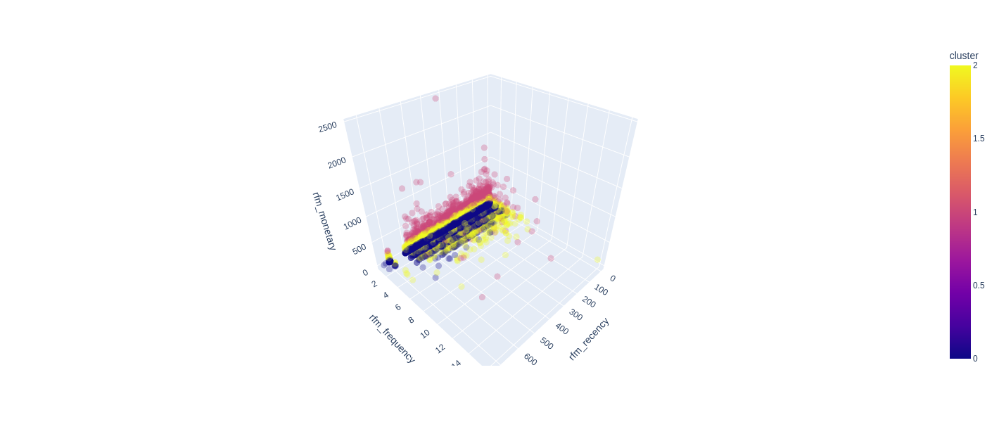

In [22]:
import plotly.express as px
fig = px.scatter_3d(
    data_w_cluster, x='rfm_recency', y='rfm_frequency', z='rfm_monetary', opacity=0.3,
    color='cluster', width=800, height=600
)
fig.update_traces(marker_size = 3)
fig.show()

## DBSCAN

Utilisons maintenant l'algorithme du DBSCAN. Pour cela, nous allons faire une recherche des paramètres optimals : 
 - Epsilon : distance en dessous de laquelle deux points sont considérés comme voisins
 - MinSample : nombre minimum de voisins qu'un point doit avoir pour être considéré comme core point

### Recherche Epsilon et MinSample

In [23]:
from sklearn import neighbors
neigh = neighbors.NearestNeighbors(n_neighbors=6) # k = 2 * nb_features
nbrs = neigh.fit(X_norm)
distances, indices = nbrs.kneighbors(X_norm)
distances = np.sort(distances, axis=0)
distances = distances[:,1]

In [24]:
plt.plot(distances)
plt.ylim(0, 1)
plt.xlim(91000, 96000)

(91000.0, 96000.0)

Une valeur pour Epsilon serait de 0.25 pour un MinSample de 6.

In [25]:
data_w_cluster_db = custom_result_dbscan(data[col_to_study], X_norm, eps=0.25, min_samples=6)

Nombre de clusters : 34
Nombre de points dans le bruit : 780 soit 0.82 %


Cela nous donne un nombre de cluster de 34. Il y en a beaucoup trop. Nous allons donc tester des valeurs de paramètres autour des valeurs obtenues.

In [26]:
from sklearn.metrics import adjusted_rand_score

In [27]:
result = compute_dbscan(X_norm, kmeans.labels_, epsilon_range=np.arange(0.5, 1.0, 0.10), min_sample_range=range(15, 35, 5))

-----                                                                                               5.0%
----------                                                                                          10.0%
---------------                                                                                     15.0%
RAM : 55.2 %
--------------------                                                                                20.0%
RAM : 62.2 %
-------------------------                                                                           25.0%
------------------------------                                                                      30.0%
-----------------------------------                                                                 35.0%
----------------------------------------                                                            40.0%
RAM : 55.5 %
---------------------------------------------                                                       45.0%
RAM : 62

In [28]:
best_result_dbscan = result.sort_values(by=["cluster", "noise"], ascending=[True, True]).reset_index(drop=True)
# display(best_result_dbscan.head(20).describe())
display(best_result_dbscan.head())
print("Meilleure combinaison : Epsilon", best_result_dbscan.iloc[0]["eps"], "- MinSample", int(best_result_dbscan.iloc[0]["minsample"]))

,eps,minsample,cluster,noise,ari
0,0.9,15,4,346,0.2192
1,0.8,15,4,371,0.2195
2,0.9,20,4,390,0.2195
3,0.9,25,4,414,0.2202
4,0.8,20,4,418,0.2201


Meilleure combinaison : Epsilon 0.9 - MinSample 15


Le plus petit nombre de cluster est de 4, nous ne pouvons donc pas le comparer avec le KMeans. Nous allons cependant étudier cette répartition.

### Etude des clusters

In [29]:
data_w_cluster_db = custom_result_dbscan(data[col_to_study], X_norm, eps=0.9, min_samples=15)

Nombre de clusters : 4
Nombre de points dans le bruit : 346 soit 0.37 %


In [30]:
res = display_bilan_clusters_all(data_w_cluster_db)

,rfm_recency,rfm_frequency,rfm_monetary,cluster_size,cluster_perc
cluster,,,,,
0,243.927957,1.0,28.024486,88850,93.8
1,232.317368,2.0,53.379949,4635,4.9
2,254.251256,4.0,93.185539,199,0.2
3,244.694645,3.0,70.733782,691,0.7


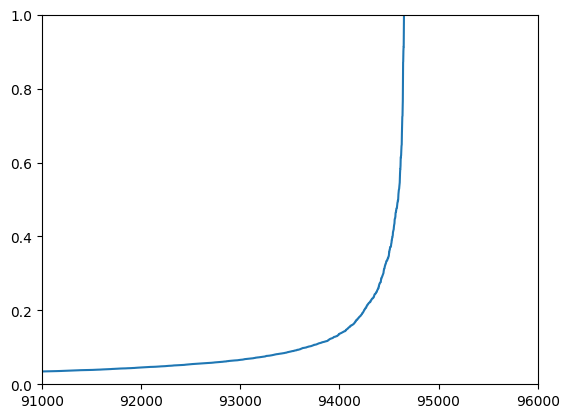

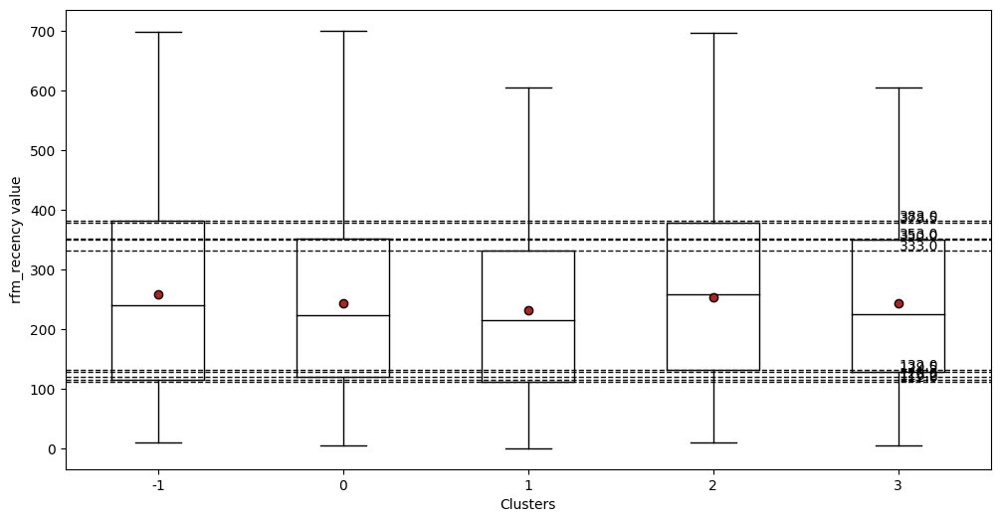

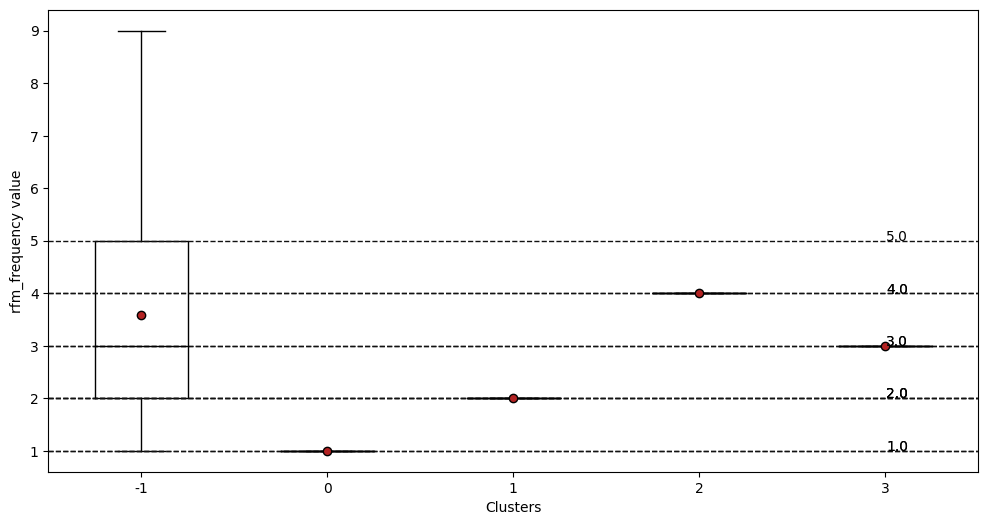

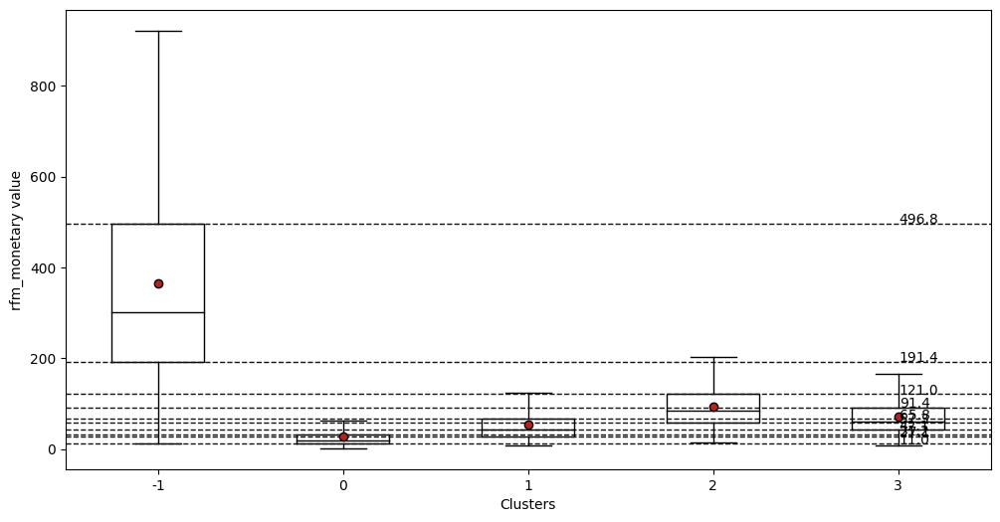

In [31]:
display_box_plot_comparison(data_w_cluster_db, col_to_study)

On voit que 2 clusters représentent moins de 1% des données. C'est donc similaire à si nous n'avions que 2 clusters. Par ailleurs, plus de 90% des données sont localisées dans un seul cluster. Ce n'est pas assez intéressant pour faire une étude de cas.

## AgglomerativeClustering

Essayons une dernière approche avec l'algorithme de clustering hiérarchique. On ne prendra qu'une partie des données pour des raisons techniques et de performances.

In [32]:
# pour info : 65% des données utilisent 75% de ma RAM (37Go utilisé)
# pour des raisons techniques, nous allons utiliser un échantillon de 40% des données.
nb_data = len(data)
sample_idx = data.sample(frac=0.40, random_state=42).index
agglo_data = data.loc[sample_idx]

In [33]:
X_agglo = agglo_data[col_to_study].values
scaler = preprocessing.RobustScaler()
X_norm_agglo = scaler.fit_transform(X_agglo)

In [34]:
model_3 = AgglomerativeClustering(n_clusters=3, distance_threshold=None, compute_distances=True)
model_3 = model_3.fit(X_norm_agglo)

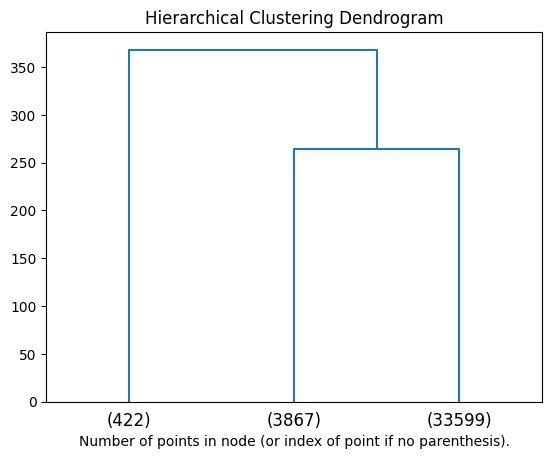

In [35]:
plt.title("Hierarchical Clustering Dendrogram")
# plot the top p levels of the dendrogram
plot_dendrogram(model_3, truncate_mode="lastp", p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

### Etudes des clusters

In [36]:
# puis on récupère le libellé du cluster pour chaque client
cluster_map_agglo_3 = pd.DataFrame()
cluster_map_agglo_3['customer_unique_id'] = agglo_data.index.values
cluster_map_agglo_3['cluster'] = model_3.labels_
# on incorpore cette données au dataframe global
data_w_cluster_agglo_3 = pd.merge(agglo_data, cluster_map_agglo_3, on="customer_unique_id", how="inner")
data_w_cluster_agglo_3.set_index("customer_unique_id", inplace=True)

In [37]:
res = display_bilan_clusters_all(data_w_cluster_agglo_3)

,rfm_recency,rfm_frequency,rfm_monetary,panier_moyen,avance_sur_livraison_moyen,review_score_mean,fiche_score,cluster_size,cluster_perc
cluster,,,,,,,,,
0,249.485782,1.864929,312.872682,256.804312,11.735677,3.775560,0.618024,422,1.1
1,240.923450,1.042204,20.379563,19.705020,10.864889,4.120425,0.607244,33599,88.7
2,261.741660,1.323507,91.233732,80.554150,11.653634,3.937935,0.613096,3867,10.2


On peut voir un clustering très déséquilibré de la même manière que pour le DBSCAN. En revanche, ayant choisi le même nombre de cluster, nous pouvons comparer avec le ARI-score.

In [38]:
kmeans = cluster.KMeans(n_clusters=3, random_state=42)
kmeans.fit(X_norm_agglo)
ari_agglo_kmeans = round(adjusted_rand_score(kmeans.labels_, model_3.labels_), 4)
print("ARI-score entre KMeans et AgglomerativeClustering :", ari_agglo_kmeans)

ARI-score entre KMeans et AgglomerativeClustering : 0.8779


En effet, le ARI-score est supérieur à 0.50. Ce qui montre une certaine similarité et donc que une étude par AgglomerativeClustering n'apporte pas de valeurs ajoutées. Par ailleurs, seulement 40% des données n'est pas très représentatif de notre dataset. A partir de là, nous allons donc continuer avec l'algorithme du KMeans.

# Scénarii migration population

## Scénario 1 : variables RFM

Nous allons maintenant voir l'intérêt du clustering selon nos 3 variables de bases (RFM) en calculant le gain obtenu selon un premier scénario. Nous allons déplacer 20% des petits acheteurs et 20% des acheteurs moyens dans le cluster des bons acheteurs et comparer le CA.

In [39]:
# CA global avec la répartition actuelle
ca_global_ref = data_w_cluster["rfm_monetary"].sum()
print("Le CA global pour cette configuration est de", f'{round(ca_global_ref, 2):,}'.replace(',', ' '), "€.")

Le CA global pour cette configuration est de 2 931 198.43 €.


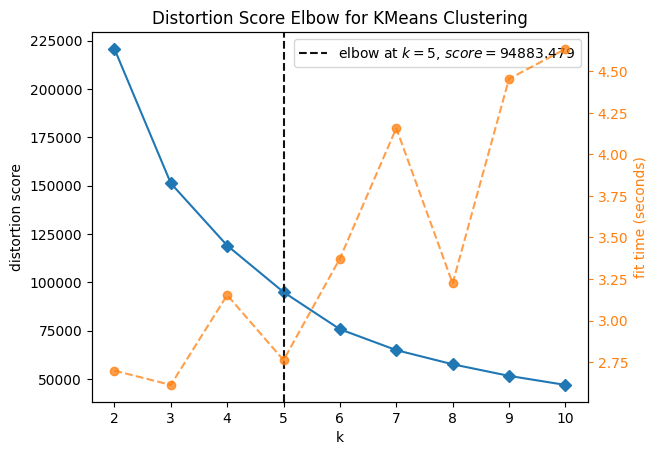

Clusters définis en: 31.0 s, soit 1.0 min, soit 0.0 h.
D'après cette analyse, le nombre de cluster optimal est de 5
Test du KMeans avec k = 5


,rfm_recency,rfm_frequency,rfm_monetary,cluster_size,cluster_perc
cluster,,,,,
0,240.953486,1.297704,71.420069,11760,12.4
1,134.036746,1.034565,19.117948,46753,49.4
2,244.242134,1.448700,190.657949,2193,2.3
3,396.068949,1.036670,18.720127,33706,35.6
4,237.514563,1.556634,480.205515,309,0.3


Test du KMeans avec k = 4


,rfm_recency,rfm_frequency,rfm_monetary,cluster_size,cluster_perc
cluster,,,,,
0,243.405093,1.030960,18.125369,77908,82.2
1,236.979943,1.538682,462.722761,349,0.4
2,245.302679,1.435426,179.572764,2501,2.6
3,243.481773,1.273580,65.063774,13963,14.7


Test du KMeans avec k = 3


,rfm_recency,rfm_frequency,rfm_monetary,cluster_size,cluster_perc
cluster,,,,,
0,243.472334,1.045629,20.607670,84726,89.4
1,248.060280,1.501615,334.148481,929,1.0
2,242.693911,1.350430,96.488975,9066,9.6


La valeur optimale de k est 3


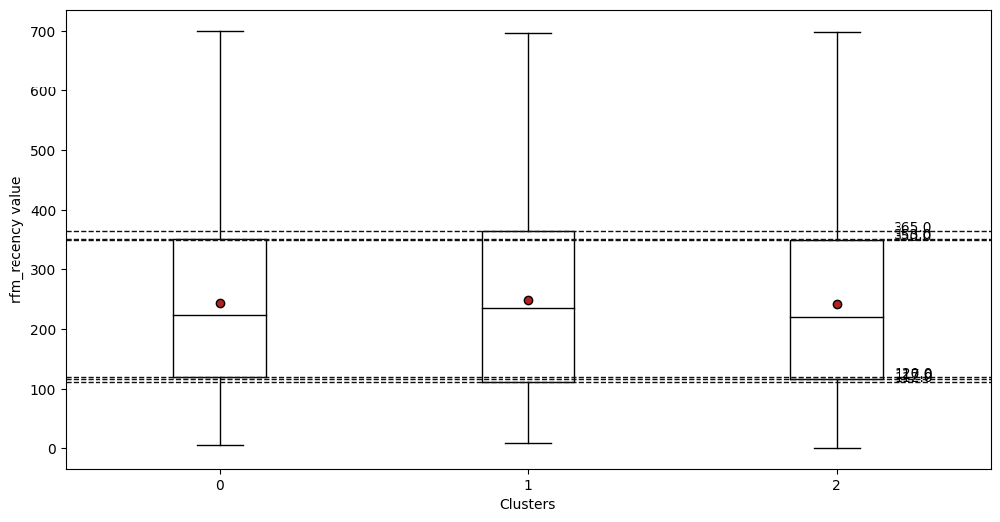

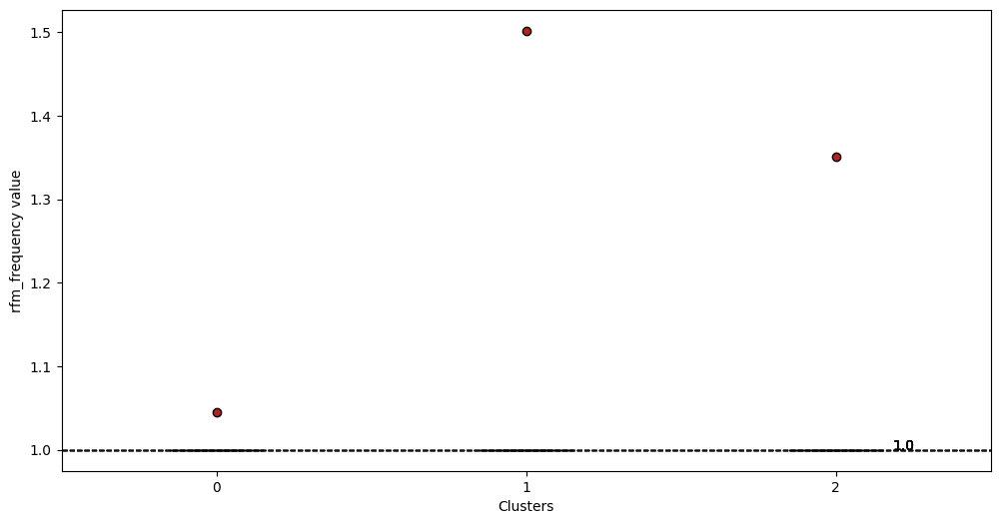

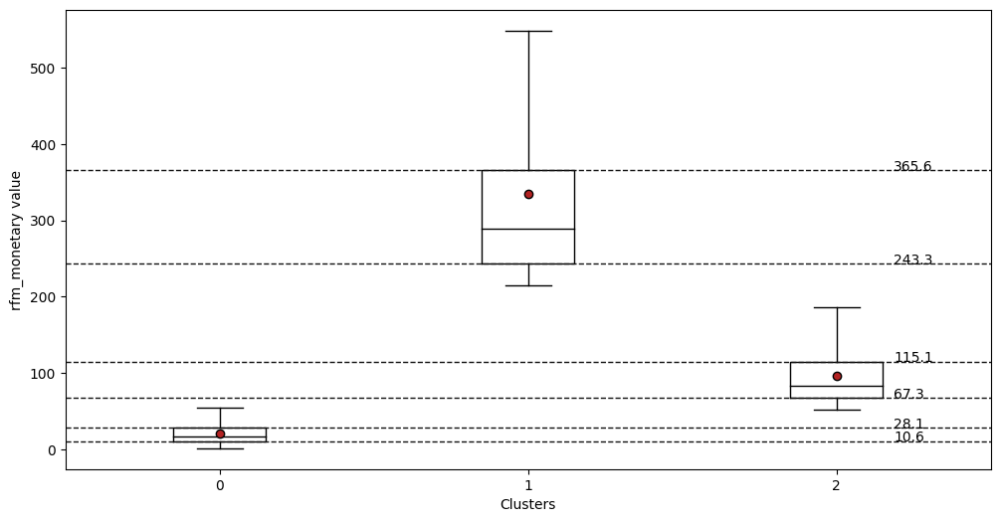

Configuration avec les variables : rfm_recency, rfm_frequency, rfm_monetary
Le CA global pour cette configuration est de 8 243 214.25 €, soit une augmentation de 5 312 015.81 €, càd 181.2 %


In [40]:
col_to_study = ["rfm_recency", "rfm_frequency", "rfm_monetary"]
kmeans_config_1 = test_scenario(data, col_to_study, ca_global_ref, display_boxplot=True, lim_k=3)

Nous allons maintenant refaire le même calcul selon différents scénarii en incluant les autres variables présentes dans notre dataset.

# Scénario 2 : toutes les variables

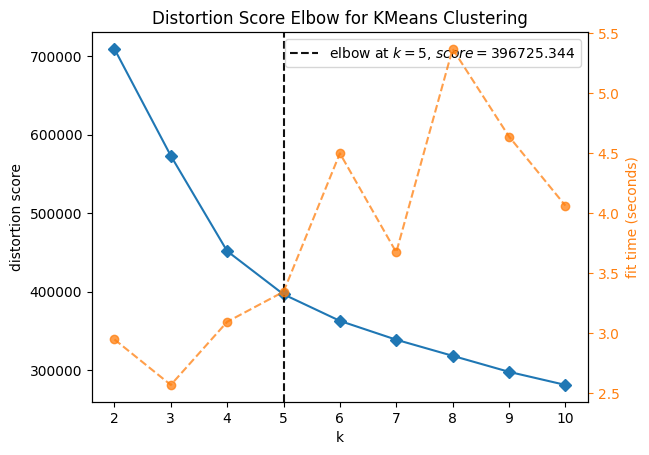

Clusters définis en: 35.0 s, soit 1.0 min, soit 0.0 h.
D'après cette analyse, le nombre de cluster optimal est de 5
Test du KMeans avec k = 5


,rfm_recency,rfm_frequency,rfm_monetary,panier_moyen,avance_sur_livraison_moyen,review_score_mean,fiche_score,cluster_size,cluster_perc
cluster,,,,,,,,,
0,245.462921,1.089254,23.614281,21.765537,3.520281,1.717102,0.608045,16694,17.6
1,242.431919,1.041753,17.404983,16.816997,12.435432,4.690287,0.607029,61625,65.1
2,244.147394,1.205633,61.555071,54.705340,13.387905,4.443242,0.616227,13067,13.8
3,242.113022,1.221130,433.074339,391.292022,10.347983,3.716462,0.612376,407,0.4
4,250.242145,1.228484,165.231630,148.454841,11.266252,3.856850,0.609606,2928,3.1


Test du KMeans avec k = 4


,rfm_recency,rfm_frequency,rfm_monetary,panier_moyen,avance_sur_livraison_moyen,review_score_mean,fiche_score,cluster_size,cluster_perc
cluster,,,,,,,,,
0,247.629828,1.095694,24.234047,22.157708,4.565347,1.839076,0.608503,18486,19.5
1,244.374928,1.249134,108.748264,96.162728,12.172388,4.071234,0.612515,6932,7.3
2,250.245679,1.208642,344.714013,312.361120,11.003812,3.859280,0.623384,810,0.9
3,242.137985,1.056123,21.172186,20.137061,12.549501,4.719089,0.608027,68493,72.3


Test du KMeans avec k = 3


,rfm_recency,rfm_frequency,rfm_monetary,panier_moyen,avance_sur_livraison_moyen,review_score_mean,fiche_score,cluster_size,cluster_perc
cluster,,,,,,,,,
0,250.773765,1.223457,200.210872,180.436451,11.603803,3.948402,0.610269,3240,3.4
1,242.095837,1.064183,24.180162,22.753668,12.602359,4.717305,0.608511,72091,76.1
2,247.225890,1.111294,27.815532,24.936508,4.699694,1.841231,0.608552,19390,20.5


La valeur optimale de k est 3
Configuration avec les variables : rfm_recency, rfm_frequency, rfm_monetary, panier_moyen, avance_sur_livraison_moyen, review_score_mean, fiche_score
Le CA global pour cette configuration est de 5 474 049.89 €, soit une augmentation de 2 542 851.46 €, càd 86.8 %


KMeans(n_clusters=3, random_state=42)

In [41]:
col_to_study = ["rfm_recency", "rfm_frequency", "rfm_monetary", "panier_moyen", "avance_sur_livraison_moyen", "review_score_mean", "fiche_score"]
test_scenario(data, col_to_study, ca_global_ref)

## Scénario 3 : sélection de variables

### RFM + 1 variable

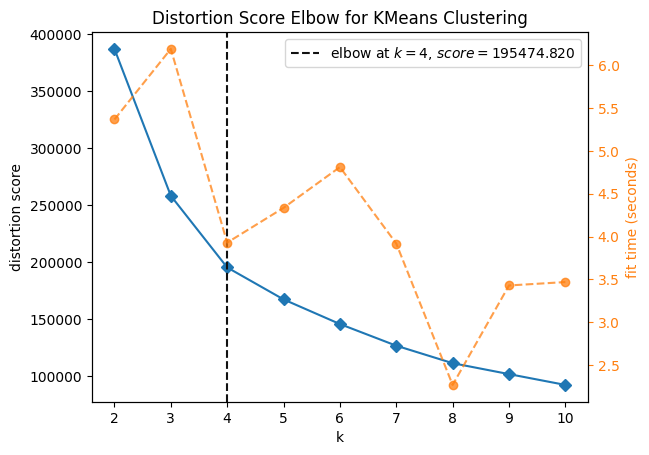

Clusters définis en: 38.0 s, soit 1.0 min, soit 0.0 h.
D'après cette analyse, le nombre de cluster optimal est de 4
Test du KMeans avec k = 4


,rfm_recency,rfm_frequency,rfm_monetary,review_score_mean,cluster_size,cluster_perc
cluster,,,,,,
0,241.145266,1.391885,122.514371,4.062288,5693,6.0
1,241.879698,1.047943,21.933612,4.746324,68644,72.5
2,240.905512,1.546457,381.203419,3.683561,635,0.7
3,249.619879,1.083042,24.611327,1.888562,19749,20.8


Test du KMeans avec k = 3


,rfm_recency,rfm_frequency,rfm_monetary,review_score_mean,cluster_size,cluster_perc
cluster,,,,,,
0,241.702009,1.058899,24.518176,4.744825,71274,75.2
1,245.265874,1.443803,211.110038,3.924123,2945,3.1
2,249.232807,1.097747,27.410540,1.893978,20502,21.6


La valeur optimale de k est 3


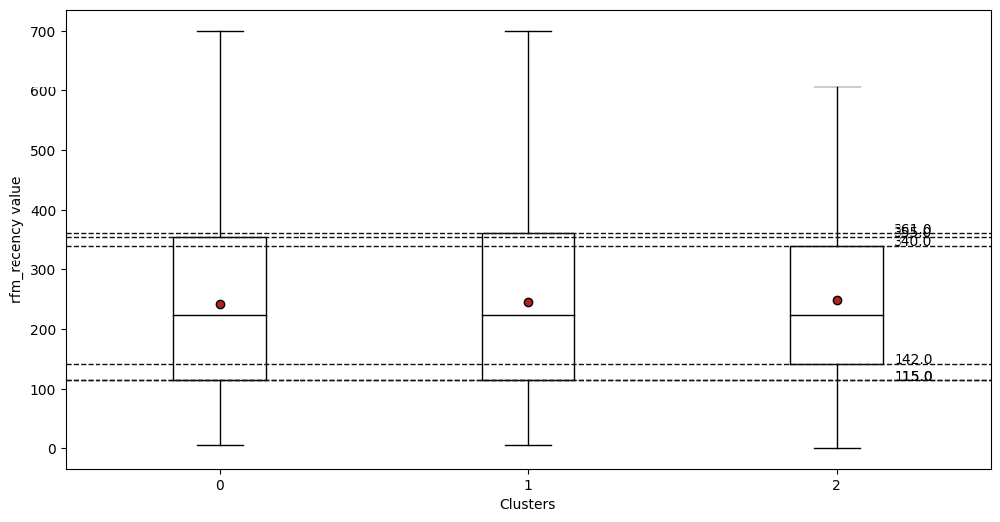

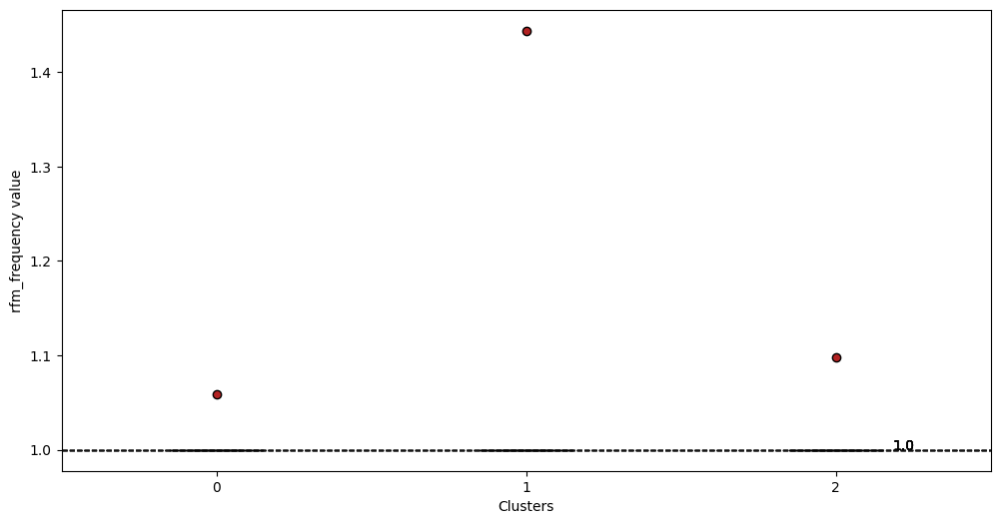

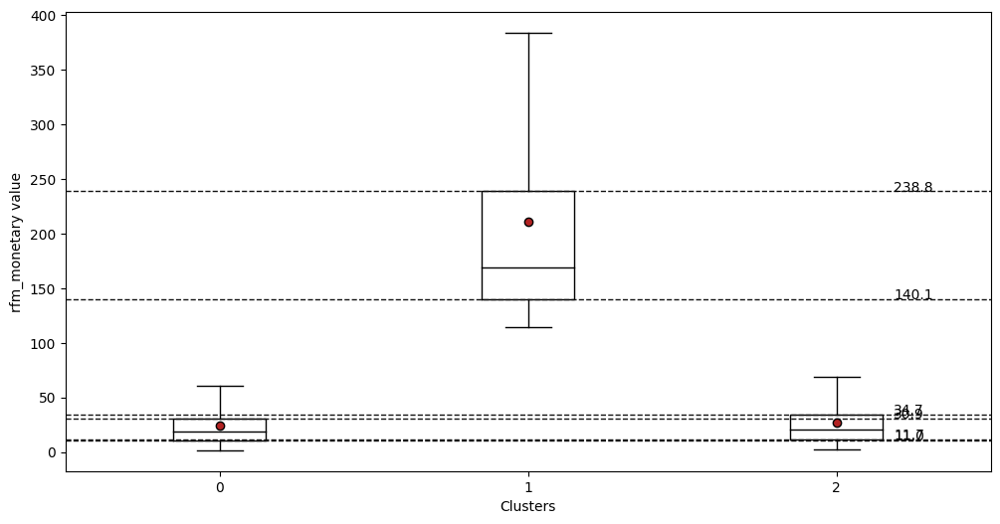

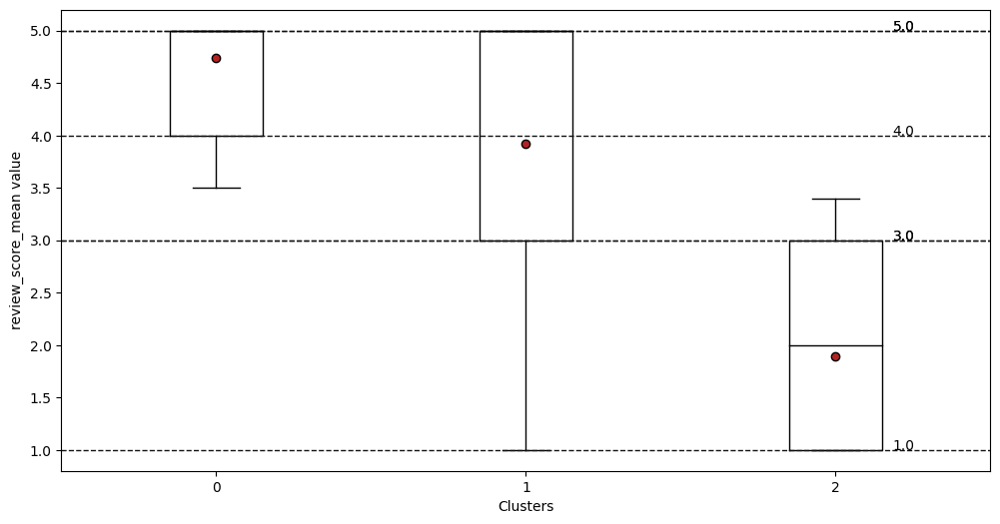

Configuration avec les variables : rfm_recency, rfm_frequency, rfm_monetary, review_score_mean
Le CA global pour cette configuration est de 5 593 558.49 €, soit une augmentation de 2 662 360.05 €, càd 90.8 %


In [42]:
col_to_study = ["rfm_recency", "rfm_frequency", "rfm_monetary", "review_score_mean"]
kmeans_config_2 = test_scenario(data, col_to_study, ca_global_ref, display_boxplot=True)

On observe bien les 3 groupes : 
 - bons acheteurs (entre 140 et 240 €), fidèles (1.4 fois), satisfaits (3.9)
 - petits acheteurs (entre 10 et 40 €), réguliers (1.1 fois), insatisfaits (1.9)
 - petits acheteurs (entre 10 et 40 €), occasionnels (1 fois), très satisfaits (4.7)

En revanche, tous les clusters sont homogènes concernant la recency.

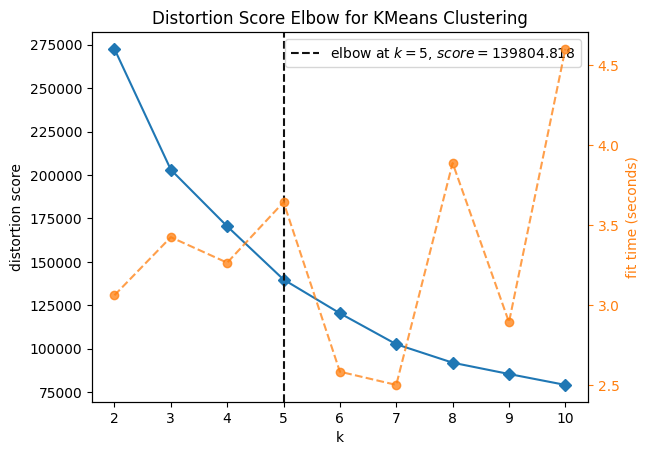

Clusters définis en: 30.0 s, soit 0.0 min, soit 0.0 h.
D'après cette analyse, le nombre de cluster optimal est de 5
Test du KMeans avec k = 5


,rfm_recency,rfm_frequency,rfm_monetary,fiche_score,cluster_size,cluster_perc
cluster,,,,,,
0,233.356025,1.034887,18.901500,0.691879,56496,59.6
1,244.072404,1.448087,190.576696,0.619239,2196,2.3
2,267.130586,1.035322,19.071091,0.403471,23923,25.3
3,237.514563,1.556634,480.205515,0.613026,309,0.3
4,243.750615,1.299822,71.222488,0.623496,11797,12.5


Test du KMeans avec k = 4


,rfm_recency,rfm_frequency,rfm_monetary,fiche_score,cluster_size,cluster_perc
cluster,,,,,,
0,232.920350,1.051171,21.561194,0.691794,60640,64.0
1,243.300538,1.369203,104.759740,0.616153,7806,8.2
2,268.600722,1.043383,20.543592,0.407697,25471,26.9
3,241.449005,1.521144,351.625993,0.622823,804,0.8


Test du KMeans avec k = 3


,rfm_recency,rfm_frequency,rfm_monetary,fiche_score,cluster_size,cluster_perc
cluster,,,,,,
0,243.478898,1.045579,20.610550,0.607514,84732,89.5
1,248.060280,1.501615,334.148481,0.623420,929,1.0
2,242.632009,1.351104,96.512293,0.617030,9060,9.6


La valeur optimale de k est 3


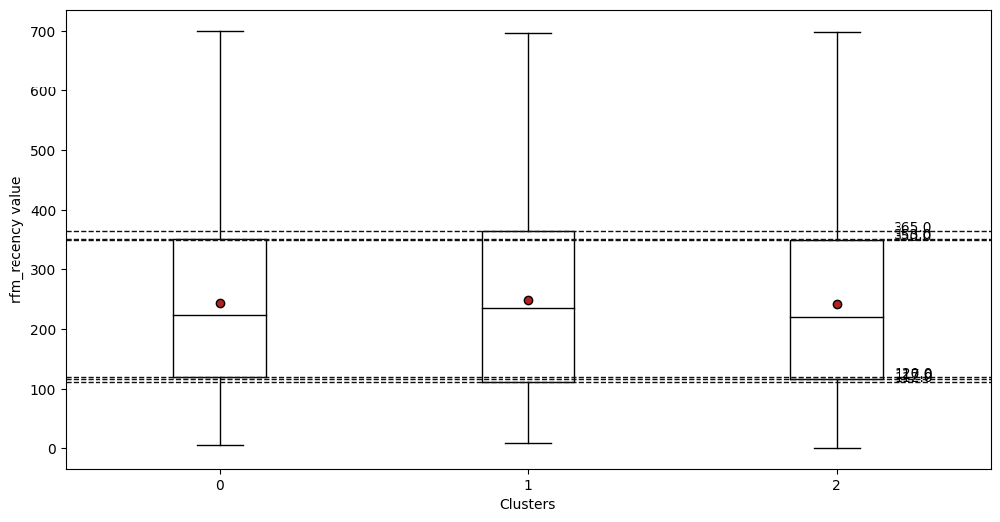

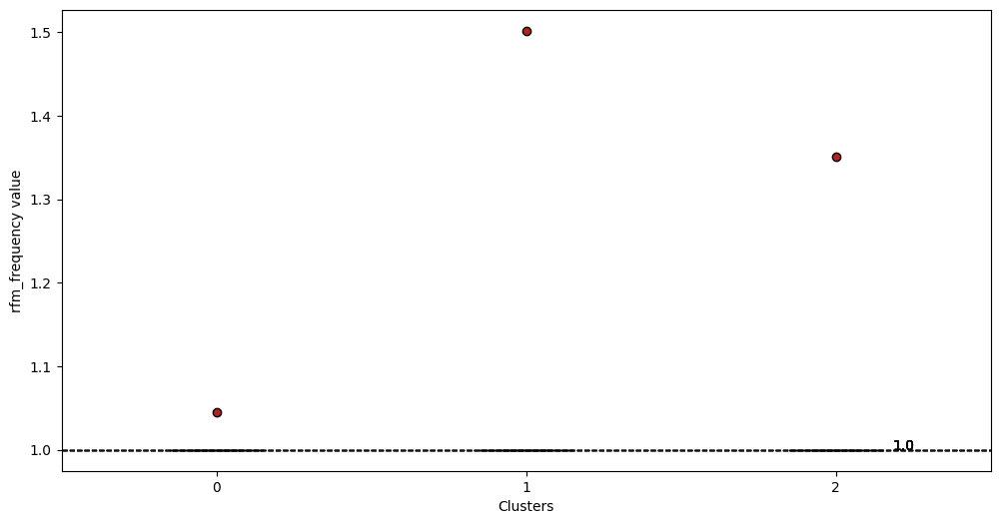

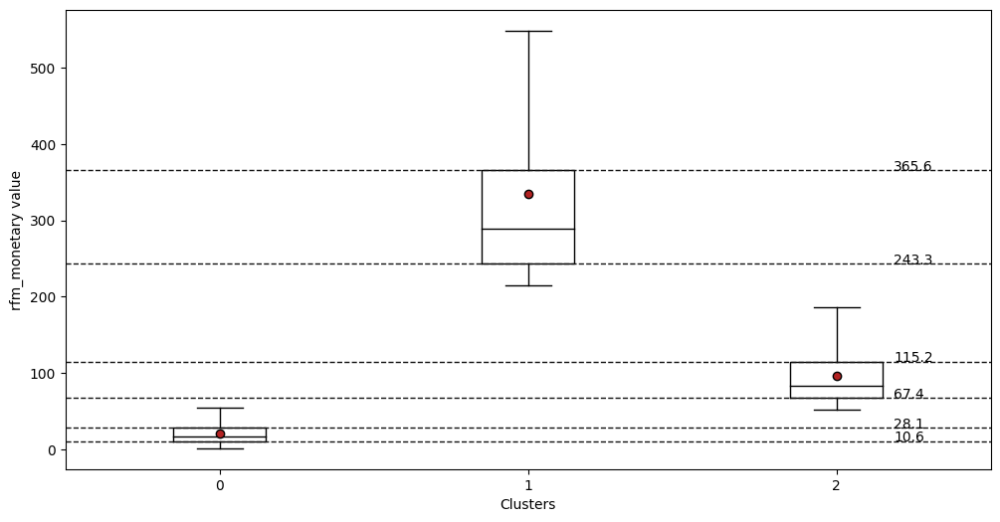

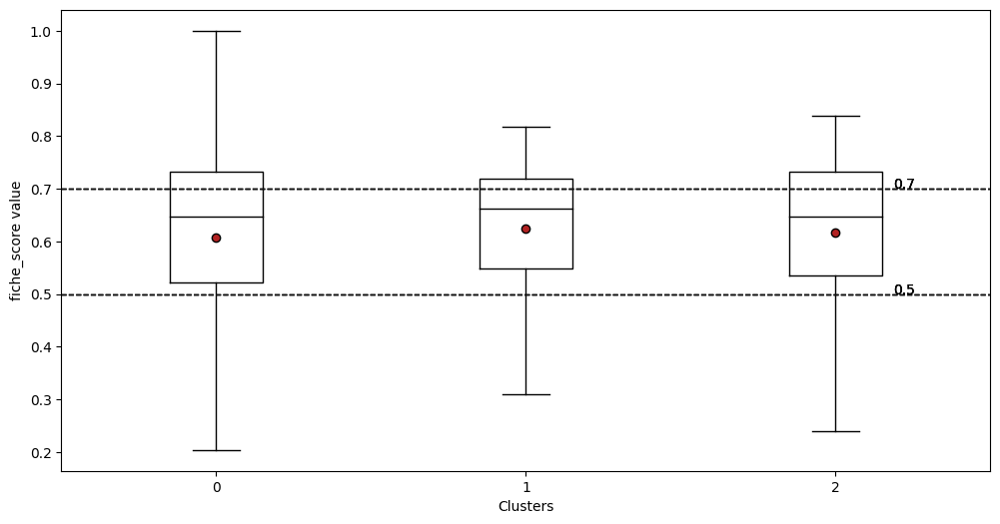

Configuration avec les variables : rfm_recency, rfm_frequency, rfm_monetary, fiche_score
Le CA global pour cette configuration est de 8 240 578.67 €, soit une augmentation de 5 309 380.24 €, càd 181.1 %


In [43]:
col_to_study = ["rfm_recency", "rfm_frequency", "rfm_monetary", "fiche_score"]
kmeans_config_3 = test_scenario(data, col_to_study, ca_global_ref, display_boxplot=True)

On observe bien les 3 groupes : 
 - bons acheteurs (entre 240 et 370 €), fidèles (1.5 fois), bonne qualité fiche produit (0.623)
 - acheteurs moyens (entre 60 et 120 €), réguliers (1.3 fois), qualité moyenne fiche produit (0.617)
 - petits acheteurs (entre 10 et 30 €), occasionnels (1 fois), mauvaise qualité fiche produit (0.608)

En revanche, tous les clusters sont homogènes concernant la recency.

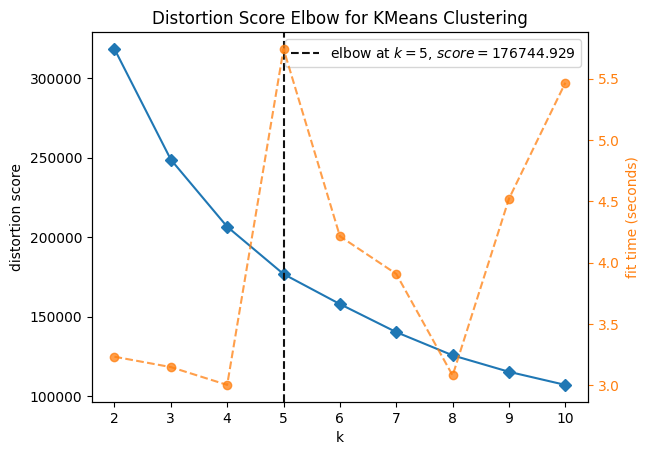

Clusters définis en: 37.0 s, soit 1.0 min, soit 0.0 h.
D'après cette analyse, le nombre de cluster optimal est de 5
Test du KMeans avec k = 5


,rfm_recency,rfm_frequency,rfm_monetary,avance_sur_livraison_moyen,cluster_size,cluster_perc
cluster,,,,,,
0,277.917942,1.038593,19.418215,16.377961,48429,51.1
1,237.514563,1.556634,480.205515,11.370952,309,0.3
2,243.914510,1.449168,191.452358,11.770784,2164,2.3
3,242.741146,1.307261,72.507353,12.079104,11238,11.9
4,192.465302,1.032013,18.822923,2.435198,32581,34.4


Test du KMeans avec k = 4


,rfm_recency,rfm_frequency,rfm_monetary,avance_sur_livraison_moyen,cluster_size,cluster_perc
cluster,,,,,,
0,196.676020,1.039728,20.364790,2.731910,35567,37.5
1,240.345639,1.379456,108.979679,11.860506,7097,7.5
2,276.329328,1.058321,22.512958,16.515966,51268,54.1
3,242.569075,1.523447,353.942733,11.609209,789,0.8


Test du KMeans avec k = 3


,rfm_recency,rfm_frequency,rfm_monetary,avance_sur_livraison_moyen,cluster_size,cluster_perc
cluster,,,,,,
0,243.437551,1.045599,20.604449,10.847899,84717,89.4
1,248.060280,1.501615,334.148481,11.647647,929,1.0
2,243.019394,1.350413,96.443791,11.836683,9075,9.6


La valeur optimale de k est 3


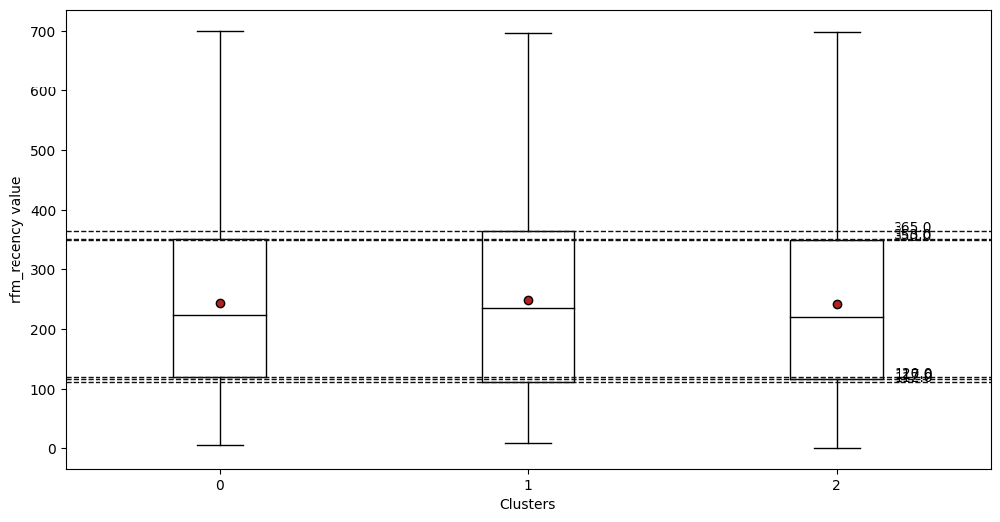

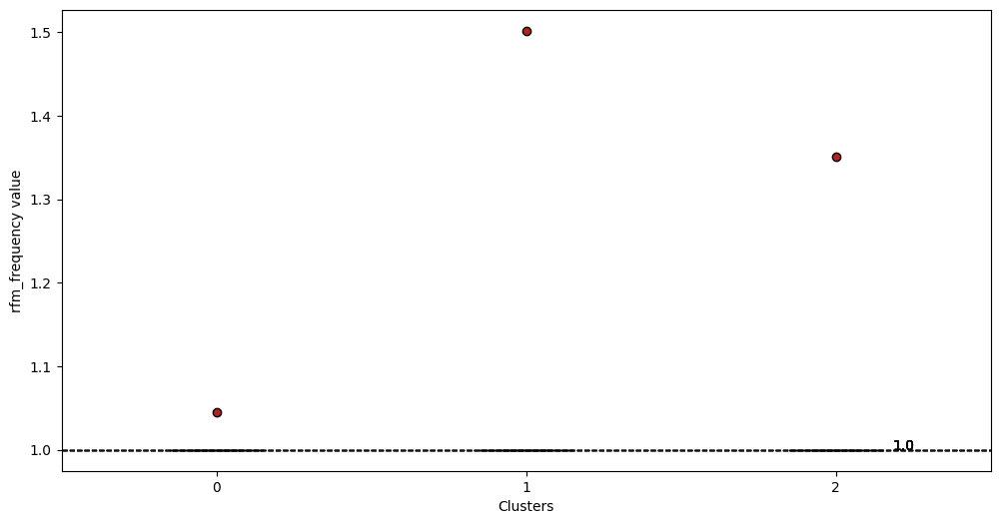

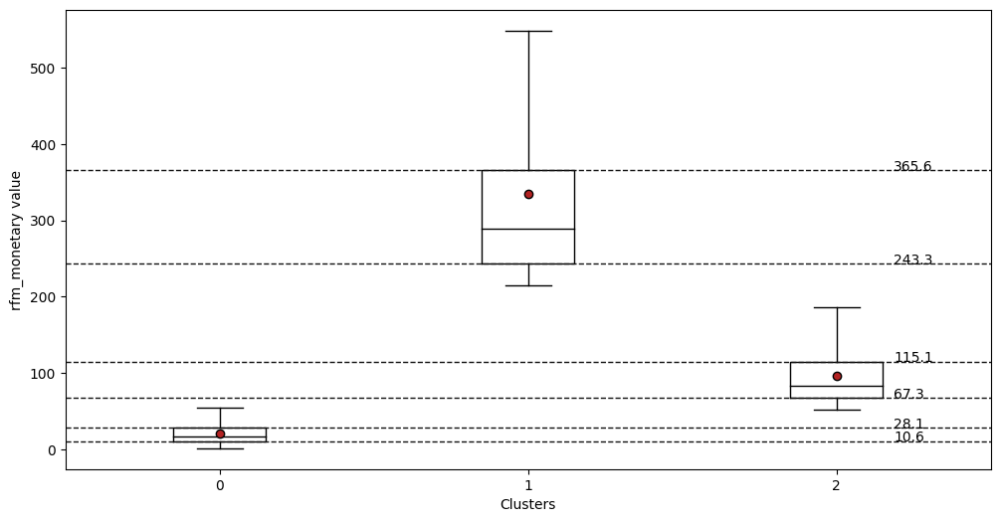

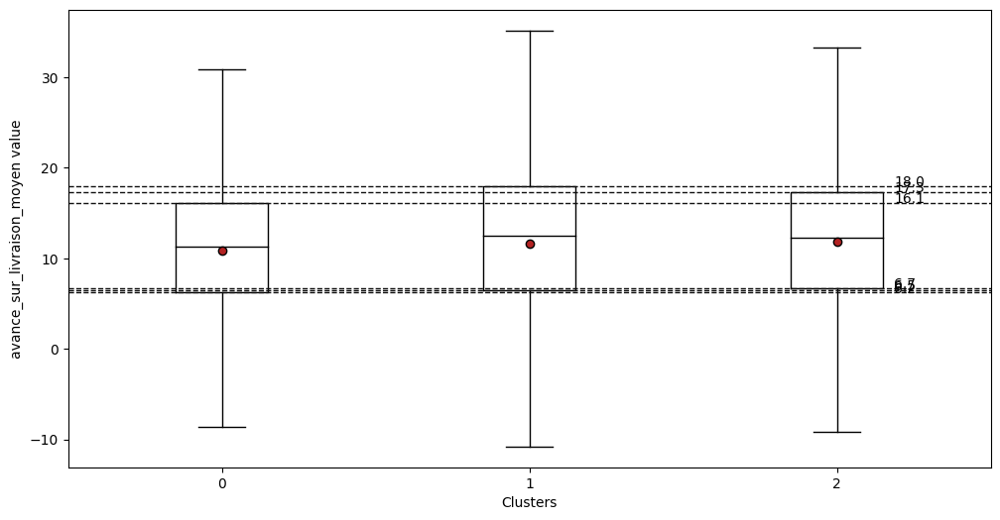

Configuration avec les variables : rfm_recency, rfm_frequency, rfm_monetary, avance_sur_livraison_moyen
Le CA global pour cette configuration est de 8 237 994.25 €, soit une augmentation de 5 306 795.82 €, càd 181.0 %


KMeans(n_clusters=3, random_state=42)

In [44]:
col_to_study = ["rfm_recency", "rfm_frequency", "rfm_monetary", "avance_sur_livraison_moyen"]
test_scenario(data, col_to_study, ca_global_ref, display_boxplot=True, lim_k=3)

On observe bien les 3 groupes : 
 - bons acheteurs (entre 240 et 370 €), fidèles (1.5 fois), livraison en avance de 11.6 jours
 - acheteurs moyens (entre 60 et 120 €), réguliers (1.3 fois), livraison en avance de 11.8 jours
 - petits acheteurs (entre 10 et 30 €), occasionnels (1 fois), livraison en avance de 10.8 jours

En revanche, tous les clusters sont homogènes concernant la recency.

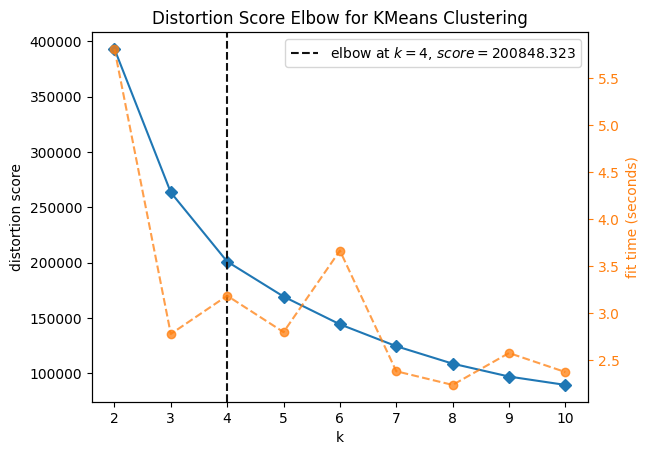

Clusters définis en: 28.0 s, soit 0.0 min, soit 0.0 h.
D'après cette analyse, le nombre de cluster optimal est de 4
Test du KMeans avec k = 4


,rfm_recency,rfm_frequency,rfm_monetary,panier_moyen,cluster_size,cluster_perc
cluster,,,,,,
0,243.552423,1.044660,17.244890,16.622191,74586,78.7
1,241.781282,1.203727,58.445017,51.889962,16743,17.7
2,242.781863,1.220588,432.707757,391.027848,408,0.4
3,250.116622,1.226877,164.169370,147.571010,2984,3.2


Test du KMeans avec k = 3


,rfm_recency,rfm_frequency,rfm_monetary,panier_moyen,cluster_size,cluster_perc
cluster,,,,,,
0,243.179648,1.059966,20.557557,19.483047,84415,89.1
1,247.009636,1.204497,327.694866,297.057733,934,1.0
2,245.457853,1.240717,94.938678,83.904640,9372,9.9


La valeur optimale de k est 3
Configuration avec les variables : rfm_recency, rfm_frequency, rfm_monetary, panier_moyen
Le CA global pour cette configuration est de 8 118 253.21 €, soit une augmentation de 5 187 054.78 €, càd 177.0 %


KMeans(n_clusters=3, random_state=42)

In [45]:
col_to_study = ["rfm_recency", "rfm_frequency", "rfm_monetary", "panier_moyen"]
test_scenario(data, col_to_study, ca_global_ref)

### RFM + 2 variables

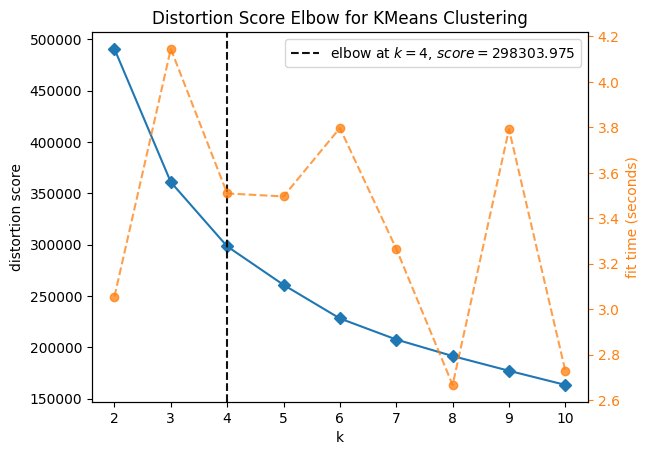

Clusters définis en: 31.0 s, soit 1.0 min, soit 0.0 h.
D'après cette analyse, le nombre de cluster optimal est de 4
Test du KMeans avec k = 4


,rfm_recency,rfm_frequency,rfm_monetary,avance_sur_livraison_moyen,panier_moyen,cluster_size,cluster_perc
cluster,,,,,,,
0,243.735097,1.044146,17.135127,10.693096,16.524458,74163,78.3
1,241.085618,1.201796,57.837816,11.997668,51.390922,17146,18.1
2,242.781863,1.220588,432.707757,10.367333,391.027848,408,0.4
3,249.771305,1.228029,163.839554,11.406821,147.229090,3004,3.2


Test du KMeans avec k = 3


,rfm_recency,rfm_frequency,rfm_monetary,avance_sur_livraison_moyen,panier_moyen,cluster_size,cluster_perc
cluster,,,,,,,
0,245.566464,1.241552,94.890597,11.581850,83.851784,9381,9.9
1,246.827807,1.205348,327.635159,11.067560,296.885409,935,1.0
2,243.169303,1.059842,20.551992,10.879007,19.480673,84405,89.1


La valeur optimale de k est 3
Configuration avec les variables : rfm_recency, rfm_frequency, rfm_monetary, avance_sur_livraison_moyen, panier_moyen
Le CA global pour cette configuration est de 3 366 365.03 €, soit une augmentation de 435 166.59 €, càd 14.8 %


KMeans(n_clusters=3, random_state=42)

In [46]:
col_to_study = ["rfm_recency", "rfm_frequency", "rfm_monetary", "avance_sur_livraison_moyen", "panier_moyen"]
test_scenario(data, col_to_study, ca_global_ref)

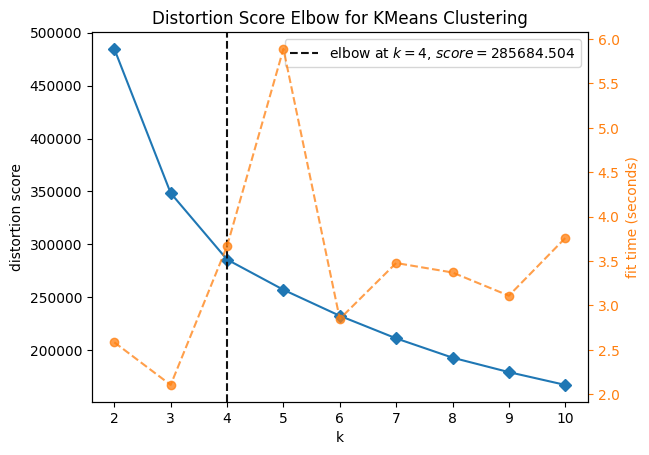

Clusters définis en: 31.0 s, soit 1.0 min, soit 0.0 h.
D'après cette analyse, le nombre de cluster optimal est de 4
Test du KMeans avec k = 4


,rfm_recency,rfm_frequency,rfm_monetary,avance_sur_livraison_moyen,review_score_mean,cluster_size,cluster_perc
cluster,,,,,,,
0,242.359619,1.047912,21.875199,12.566171,4.719872,69607,73.5
1,241.136792,1.545597,381.001517,11.650208,3.685631,636,0.7
2,248.251733,1.083556,24.921487,4.504164,1.834127,18754,19.8
3,241.115653,1.394829,122.088906,12.345558,4.069201,5724,6.0


Test du KMeans avec k = 3


,rfm_recency,rfm_frequency,rfm_monetary,avance_sur_livraison_moyen,review_score_mean,cluster_size,cluster_perc
cluster,,,,,,,
0,242.175765,1.058907,24.481903,12.604037,4.718572,72301,76.3
1,245.038789,1.445390,211.259884,11.968854,3.930093,2939,3.1
2,247.904574,1.099636,27.731612,4.659878,1.840845,19481,20.6


La valeur optimale de k est 3


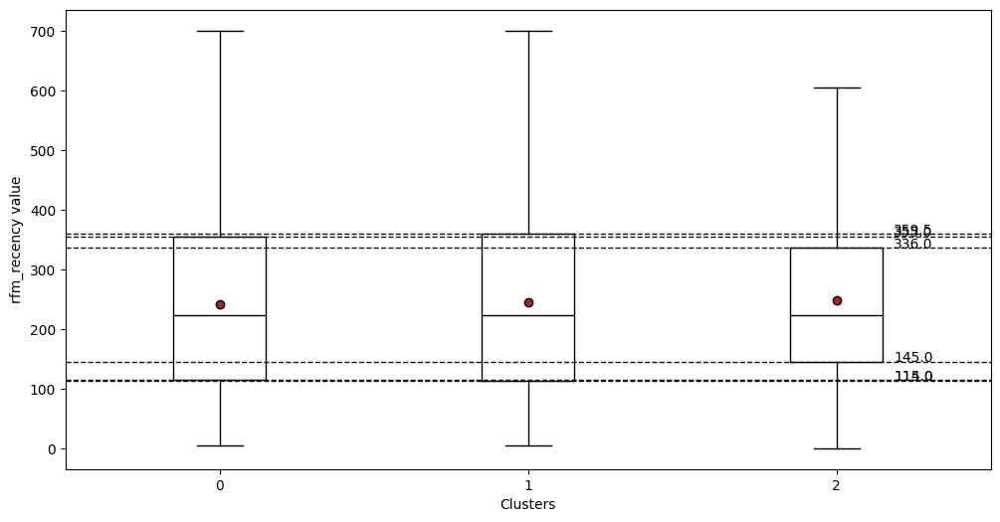

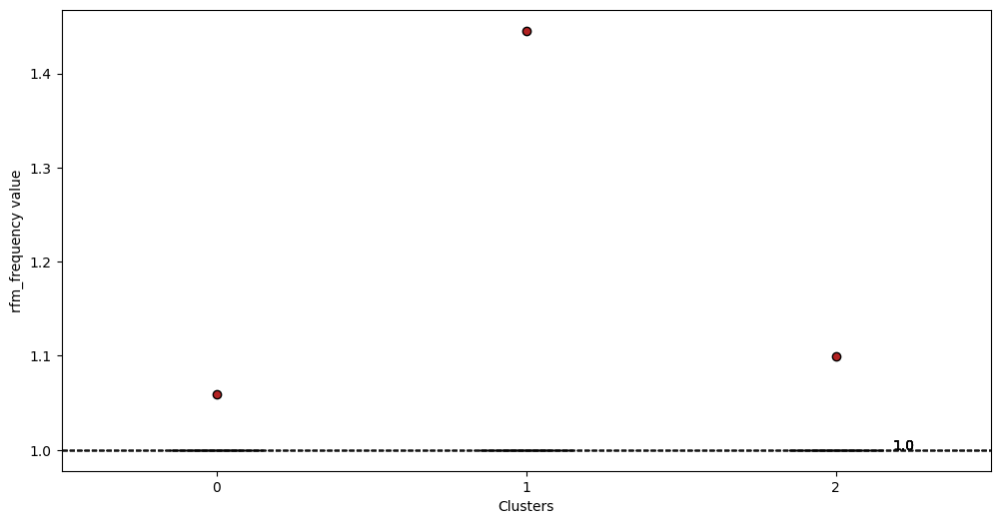

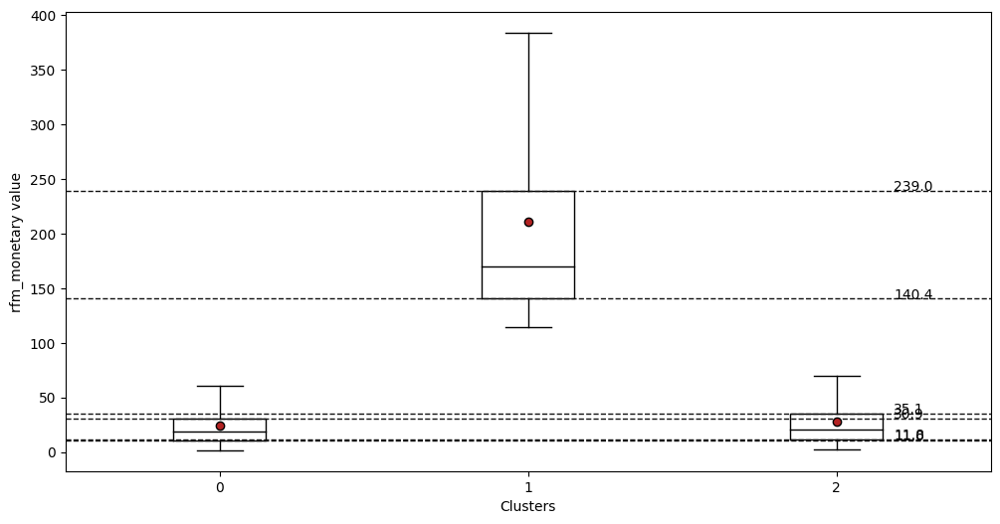

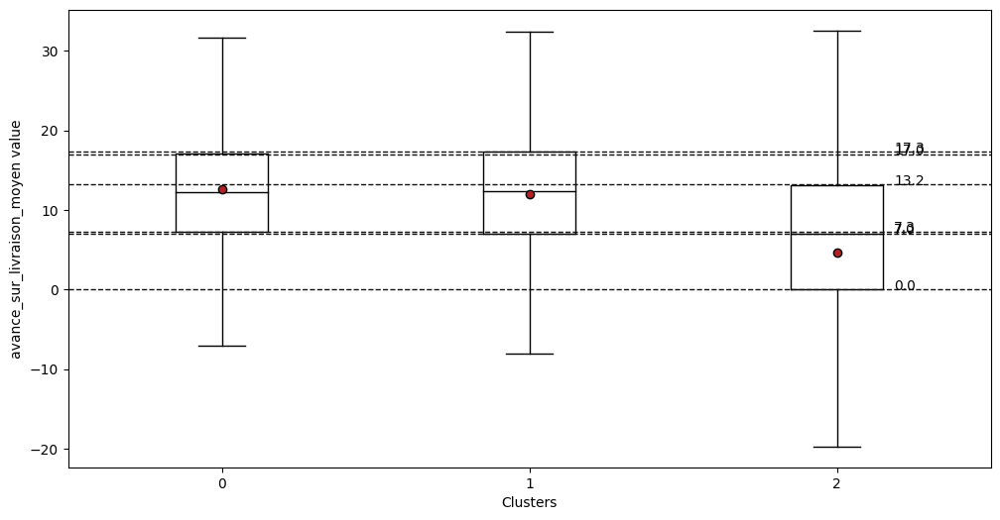

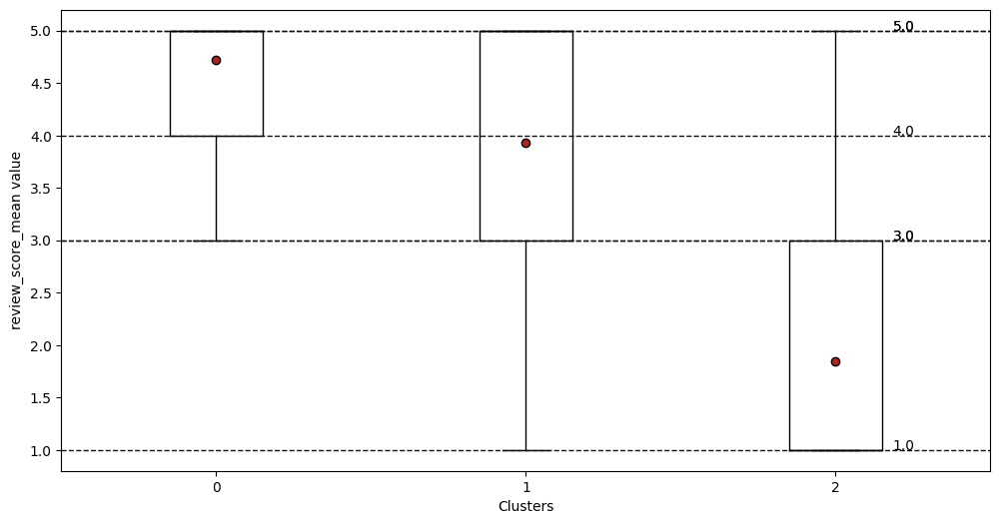

Configuration avec les variables : rfm_recency, rfm_frequency, rfm_monetary, avance_sur_livraison_moyen, review_score_mean
Le CA global pour cette configuration est de 5 632 789.21 €, soit une augmentation de 2 701 590.78 €, càd 92.2 %


KMeans(n_clusters=3, random_state=42)

In [47]:
col_to_study = ["rfm_recency", "rfm_frequency", "rfm_monetary", "avance_sur_livraison_moyen", "review_score_mean"]
test_scenario(data, col_to_study, ca_global_ref, display_boxplot=True, lim_k=3)

On observe bien les 3 groupes : 
 - bons acheteurs (entre 140 et 240 €), fidèles (1.4 fois), satisfaits (3.9)
 - petits acheteurs (entre 10 et 40 €), réguliers (1.1 fois), insatisfaits (1.9)
 - petits acheteurs (entre 10 et 40 €), occasionnels (1 fois), très satisfaits (4.7)

En revanche, tous les clusters sont homogènes concernant la recency.

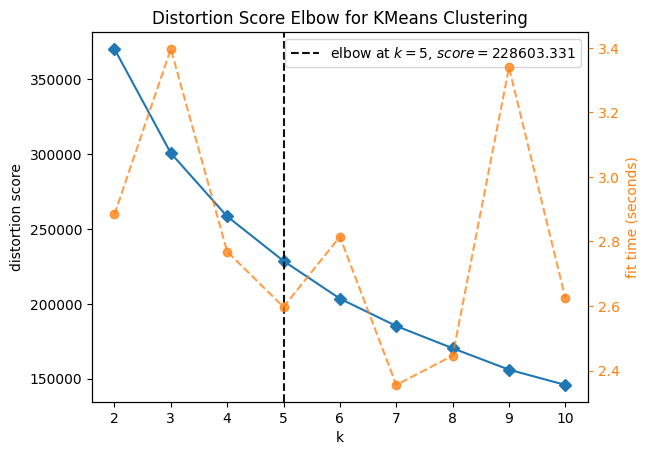

Clusters définis en: 26.0 s, soit 0.0 min, soit 0.0 h.
D'après cette analyse, le nombre de cluster optimal est de 5
Test du KMeans avec k = 5


,rfm_recency,rfm_frequency,rfm_monetary,avance_sur_livraison_moyen,fiche_score,cluster_size,cluster_perc
cluster,,,,,,,
0,192.158622,1.031952,18.854360,2.419997,0.614090,32486,34.3
1,243.921868,1.449376,191.479777,11.770637,0.619783,2163,2.3
2,277.940710,1.038558,19.396779,16.359588,0.603018,48524,51.2
3,237.514563,1.556634,480.205515,11.370952,0.613026,309,0.3
4,242.805677,1.307501,72.509308,12.084514,0.614388,11239,11.9


Test du KMeans avec k = 4


,rfm_recency,rfm_frequency,rfm_monetary,avance_sur_livraison_moyen,fiche_score,cluster_size,cluster_perc
cluster,,,,,,,
0,276.799906,1.058326,22.477899,16.521965,0.603151,51161,54.0
1,240.197832,1.379611,108.924808,11.873906,0.613624,7102,7.5
2,242.370886,1.525316,353.787170,11.620302,0.623221,790,0.8
3,196.266401,1.039643,20.414118,2.760212,0.615038,35668,37.7


Test du KMeans avec k = 3


,rfm_recency,rfm_frequency,rfm_monetary,avance_sur_livraison_moyen,fiche_score,cluster_size,cluster_perc
cluster,,,,,,,
0,243.467696,1.045606,20.608305,10.851796,0.607547,84726,89.4
1,248.060280,1.501615,334.148481,11.647647,0.623420,929,1.0
2,242.737260,1.350651,96.483043,11.801244,0.616713,9066,9.6


La valeur optimale de k est 3
Configuration avec les variables : rfm_recency, rfm_frequency, rfm_monetary, avance_sur_livraison_moyen, fiche_score
Le CA global pour cette configuration est de 8 239 418.01 €, soit une augmentation de 5 308 219.58 €, càd 181.1 %


KMeans(n_clusters=3, random_state=42)

In [48]:
col_to_study = ["rfm_recency", "rfm_frequency", "rfm_monetary", "avance_sur_livraison_moyen", "fiche_score"]
test_scenario(data, col_to_study, ca_global_ref)

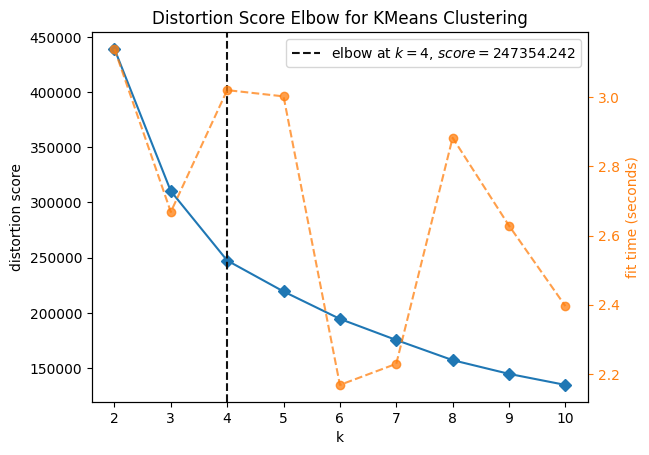

Clusters définis en: 24.0 s, soit 0.0 min, soit 0.0 h.
D'après cette analyse, le nombre de cluster optimal est de 4
Test du KMeans avec k = 4


,rfm_recency,rfm_frequency,rfm_monetary,fiche_score,review_score_mean,cluster_size,cluster_perc
cluster,,,,,,,
0,241.885867,1.047947,21.929980,0.608074,4.746364,68639,72.5
1,249.631672,1.083004,24.602850,0.608519,1.888495,19746,20.8
2,241.136792,1.545597,381.001517,0.621534,3.685631,636,0.7
3,241.009474,1.391579,122.424857,0.613441,4.061335,5700,6.0


Test du KMeans avec k = 3


,rfm_recency,rfm_frequency,rfm_monetary,fiche_score,review_score_mean,cluster_size,cluster_perc
cluster,,,,,,,
0,241.706321,1.058899,24.519509,0.608246,4.744829,71275,75.2
1,249.232807,1.097747,27.410540,0.608962,1.893978,20502,21.6
2,245.162704,1.443954,211.141140,0.614009,3.923758,2944,3.1


La valeur optimale de k est 3
Configuration avec les variables : rfm_recency, rfm_frequency, rfm_monetary, fiche_score, review_score_mean
Le CA global pour cette configuration est de 6 344 873.68 €, soit une augmentation de 3 413 675.24 €, càd 116.5 %


KMeans(n_clusters=3, random_state=42)

In [49]:
col_to_study = ["rfm_recency", "rfm_frequency", "rfm_monetary", "fiche_score", "review_score_mean"]
test_scenario(data, col_to_study, ca_global_ref)

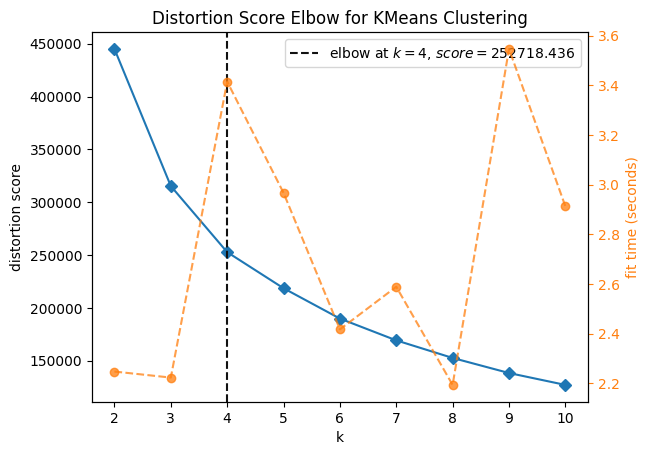

Clusters définis en: 25.0 s, soit 0.0 min, soit 0.0 h.
D'après cette analyse, le nombre de cluster optimal est de 4
Test du KMeans avec k = 4


,rfm_recency,rfm_frequency,rfm_monetary,fiche_score,panier_moyen,cluster_size,cluster_perc
cluster,,,,,,,
0,241.706423,1.203590,58.407286,0.614740,51.858944,16769,17.7
1,242.781863,1.220588,432.707757,0.612048,391.027848,408,0.4
2,250.055611,1.226801,164.149667,0.610062,147.556869,2985,3.2
3,243.572231,1.044636,17.237827,0.607116,16.615679,74559,78.7


Test du KMeans avec k = 3


,rfm_recency,rfm_frequency,rfm_monetary,fiche_score,panier_moyen,cluster_size,cluster_perc
cluster,,,,,,,
0,245.470463,1.240670,94.914818,0.613658,83.883972,9378,9.9
1,247.009636,1.204497,327.694866,0.623882,297.057733,934,1.0
2,243.178085,1.059958,20.554920,0.607846,19.480764,84409,89.1


La valeur optimale de k est 3
Configuration avec les variables : rfm_recency, rfm_frequency, rfm_monetary, fiche_score, panier_moyen
Le CA global pour cette configuration est de 3 371 053.52 €, soit une augmentation de 439 855.09 €, càd 15.0 %


KMeans(n_clusters=3, random_state=42)

In [50]:
col_to_study = ["rfm_recency", "rfm_frequency", "rfm_monetary", "fiche_score", "panier_moyen"]
test_scenario(data, col_to_study, ca_global_ref)

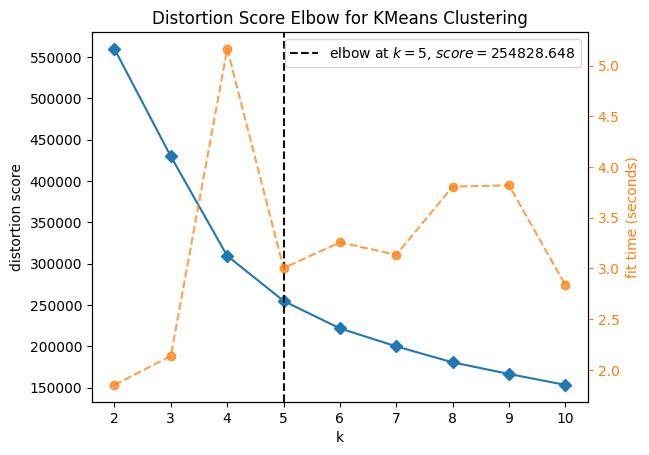

Clusters définis en: 29.0 s, soit 0.0 min, soit 0.0 h.
D'après cette analyse, le nombre de cluster optimal est de 5
Test du KMeans avec k = 5


,rfm_recency,rfm_frequency,rfm_monetary,review_score_mean,panier_moyen,cluster_size,cluster_perc
cluster,,,,,,,
0,241.429678,1.046955,18.857492,4.747307,18.127145,63103,66.6
1,247.965356,1.224251,187.330701,3.877898,169.030230,2136,2.3
2,249.499733,1.085813,22.370632,1.872225,20.654057,18750,19.8
3,244.037721,1.228445,73.679535,4.268592,65.093162,10392,11.0
4,236.461765,1.247059,458.731329,3.687059,411.265148,340,0.4


Test du KMeans avec k = 4


,rfm_recency,rfm_frequency,rfm_monetary,review_score_mean,panier_moyen,cluster_size,cluster_perc
cluster,,,,,,,
0,241.553178,1.056118,21.225126,4.745451,20.189177,67519,71.3
1,244.487759,1.247120,108.707561,4.064568,96.186295,6944,7.3
2,249.346822,1.094354,23.859291,1.892795,21.821497,19448,20.5
3,250.245679,1.208642,344.714013,3.859280,312.361120,810,0.9


Test du KMeans avec k = 3


,rfm_recency,rfm_frequency,rfm_monetary,review_score_mean,panier_moyen,cluster_size,cluster_perc
cluster,,,,,,,
0,243.181386,1.059810,20.551441,4.128432,19.480993,84400,89.1
1,245.438585,1.241824,94.874806,3.887897,83.820165,9387,9.9
2,247.009636,1.204497,327.694866,3.890989,297.057733,934,1.0


La valeur optimale de k est 3


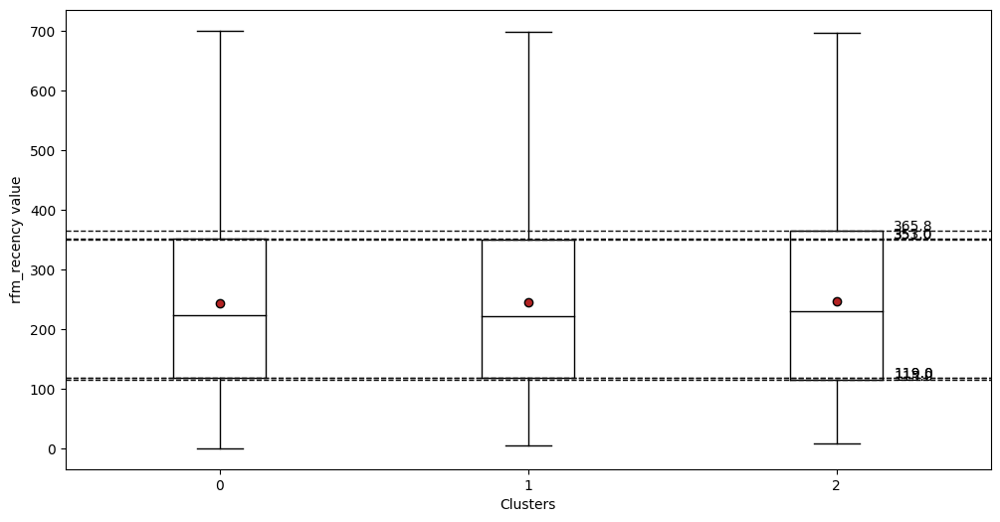

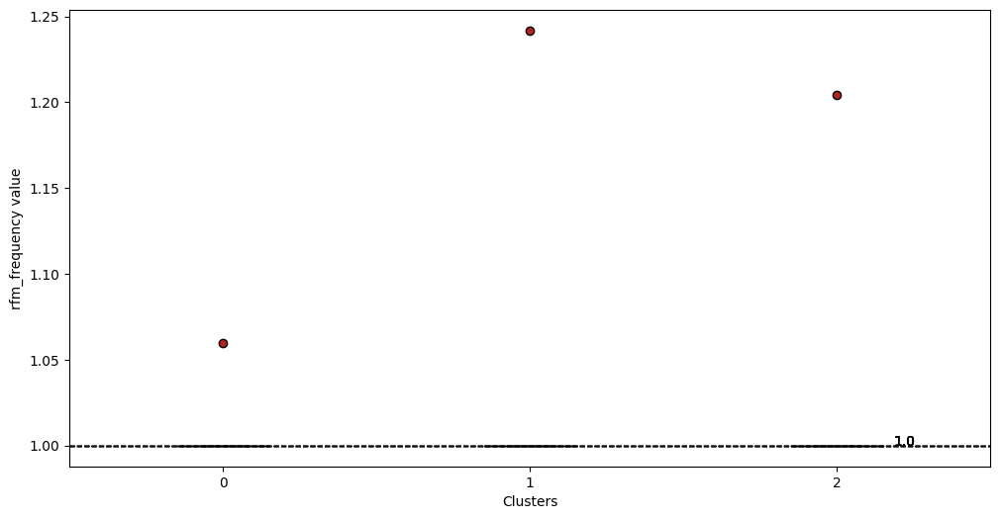

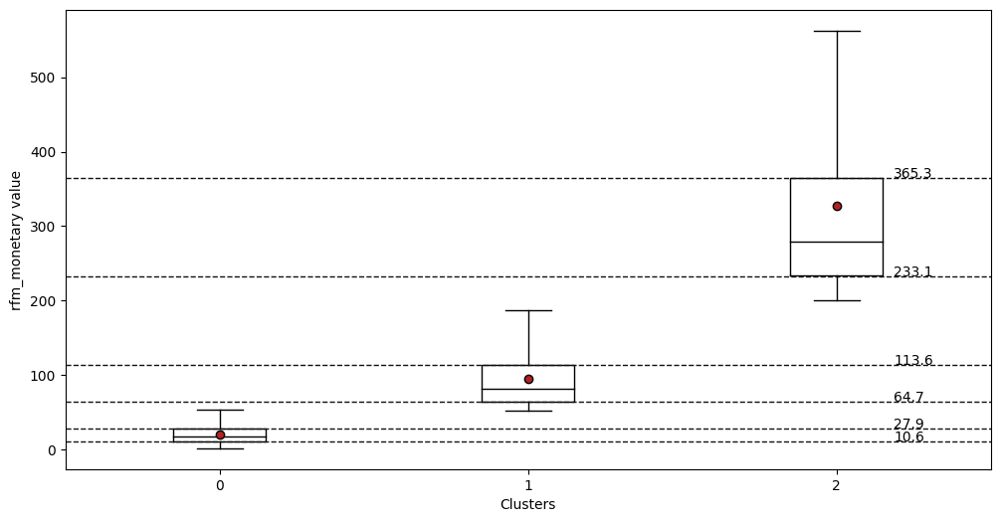

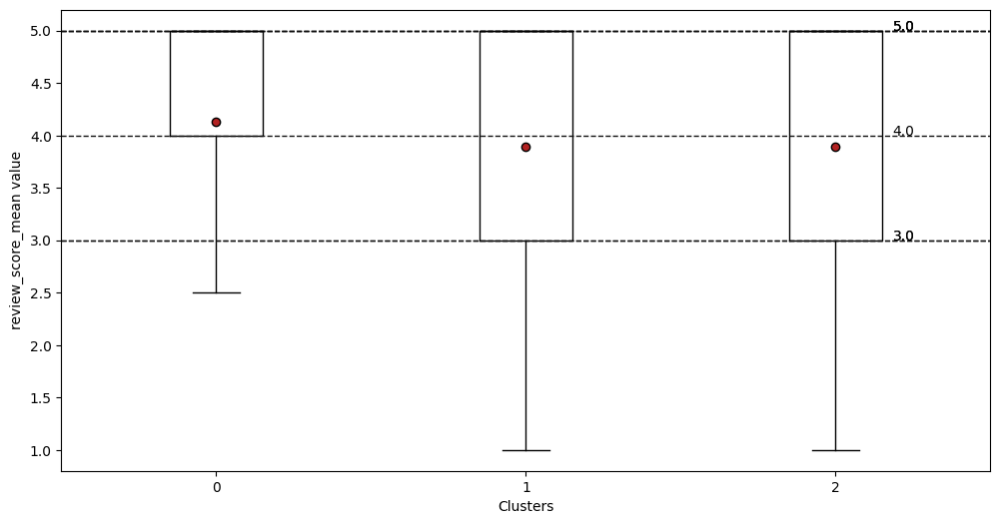

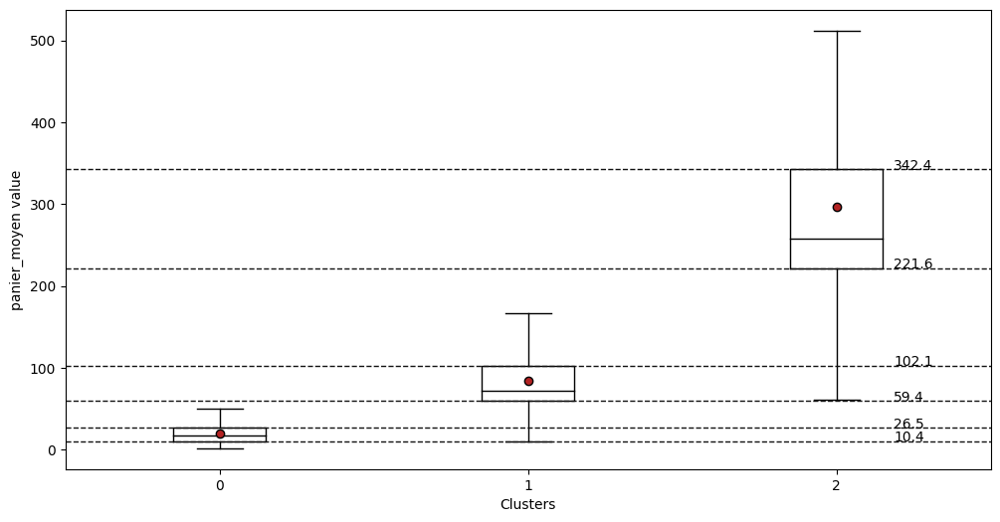

Configuration avec les variables : rfm_recency, rfm_frequency, rfm_monetary, review_score_mean, panier_moyen
Le CA global pour cette configuration est de 8 550 777.81 €, soit une augmentation de 5 619 579.37 €, càd 191.7 %


KMeans(n_clusters=3, random_state=42)

In [51]:
col_to_study = ["rfm_recency", "rfm_frequency", "rfm_monetary", "review_score_mean", "panier_moyen"]
test_scenario(data, col_to_study, ca_global_ref, display_boxplot=True)

Il semble que la variable `panier_moyen` apporte une petite dégradation, mais négligeable. Ceci peut s'expliquer par le fait que `panier_moyen` et `rfm_monetary` sont très fortement corrélées pour ce dataset. Ce qui ne sera pas forcément le cas dans le futur. Tstons malgré tout cette variables supplémentaires avec une combinaison des autres.  
A noter que l'amélioration du CA est identique à celle avec toutes les variables.

### Conclusions scénario

In [52]:
ari_kmeans_config = round(adjusted_rand_score(kmeans_config_1.labels_, kmeans_config_3.labels_), 4)
print("ARI-score entre les config 1 et 3 :", ari_kmeans_config)

ARI-score entre les config 1 et 3 : 0.9966


La meilleure configuration et celle offrant le plus d'augmentation du CA tout en étant la plus simple. La conclusion est la configuration avec les variables RFM : `rfm_recency`, `rfm_frequency`, `rfm_monetary`.